# Assignment: Training Your Neural Networks with PyTorch  

### Learning goals
By completing this assignment you will:  
- Build and train a simple feedforward neural network (MLP) in PyTorch.  
- Observe underfitting and overfitting, and try basic mitigation strategies.  
- Compare performance on regression and classification tasks.  



## Datasets

- **Regression:**  
  - [Energy Efficiency Dataset](https://archive.ics.uci.edu/dataset/242/energy+efficiency)   

- **Classification:**  
  - [Wine Dataset](https://archive.ics.uci.edu/ml/datasets/wine) (`sklearn.datasets.load_wine`)  



## Tasks  

1. **Data preparation**  
   - Load the dataset.  
   - Split into train/validation/test sets.  
   - Standardize features.  
   - Use **k-fold cross-validation** (e.g., 5-fold) on the training set to evaluate models more robustly.  

2. **Build a baseline network**  
   - Use a simple MLP (1 hidden layer, e.g., 32 units, ReLU).  
   - Use the appropriate loss for the task you selected.  
   - Experiment with different architectures to improve performance compared to baseline

3. **Training**  
   - Train with `SGD` or `Adam`.  
   - Plot **training and validation loss curves**.  

4. **Experiment: Overfitting**  
   - Make your model larger (e.g., 4 hidden layers with more units).  
   - Show whether the model overfits (compare train vs val losses across folds).  

5. **Experiment: Regularization**  
   - Add **L2 regularization** (weight decay).  
   - Add **Dropout** to hidden layers.  
   - Compare results with the baseline using cross-validation scores.  

6. **Report results**  
   - Report the corresponding metrics for the task you selected:  
   - Use **cross-validation** results to justify your conclusions (not just a single split).  
   - Explain what you observed about underfitting/overfitting.  


## Bonus exercises

- Implement **early stopping** based on validation loss.  
- Compare **optimizers** (SGD vs Adam).  
- Try different **batch sizes** (e.g., 16, 64, 256) and observe how training curves differ.  


## Deliverables  

- A notebook containing:  
  - Your PyTorch code (data prep, model, training loop).  
  - Plots of training/validation loss.  
  - Final evaluation on the test set.  
  - Your observations/explanations for the experiments.  
  - The experiments that led to your final architectures.


# Classification: Wine Dataset

## **1. Data Preparation**
   - Load the dataset.  
   - Split into train/validation/test sets.  
   - Standardize features.  
   - Use **k-fold cross-validation** (e.g., 5-fold) on the training set to evaluate models more robustly.  

### Load the dataset and visualise its structure

In [1]:
from sklearn.datasets import load_wine
import pandas as pd
import seaborn as sns

# Load dataset
wine = load_wine()
X = wine.data
y = wine.target
feature_names = wine.feature_names
target_names = wine.target_names

# Convert to DataFrame for easy exploration
df = pd.DataFrame(X, columns=feature_names)
df['classes'] = pd.Categorical.from_codes(y, target_names)
df.head()


,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,classes
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0,class_0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0,class_0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0,class_0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0,class_0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0,class_0


- We observe that all features of the dataset are numeric columns

### Check for null values

In [2]:
# Check for missing values
print("Missing values per column:")
print(df.isnull().sum())

Missing values per column:
alcohol                         0
malic_acid                      0
ash                             0
alcalinity_of_ash               0
magnesium                       0
total_phenols                   0
flavanoids                      0
nonflavanoid_phenols            0
proanthocyanins                 0
color_intensity                 0
hue                             0
od280/od315_of_diluted_wines    0
proline                         0
classes                         0
dtype: int64


- There are no missing values in the dataset

### Visualise feature distribution

Pair plot features with target `'classes'` as hue.

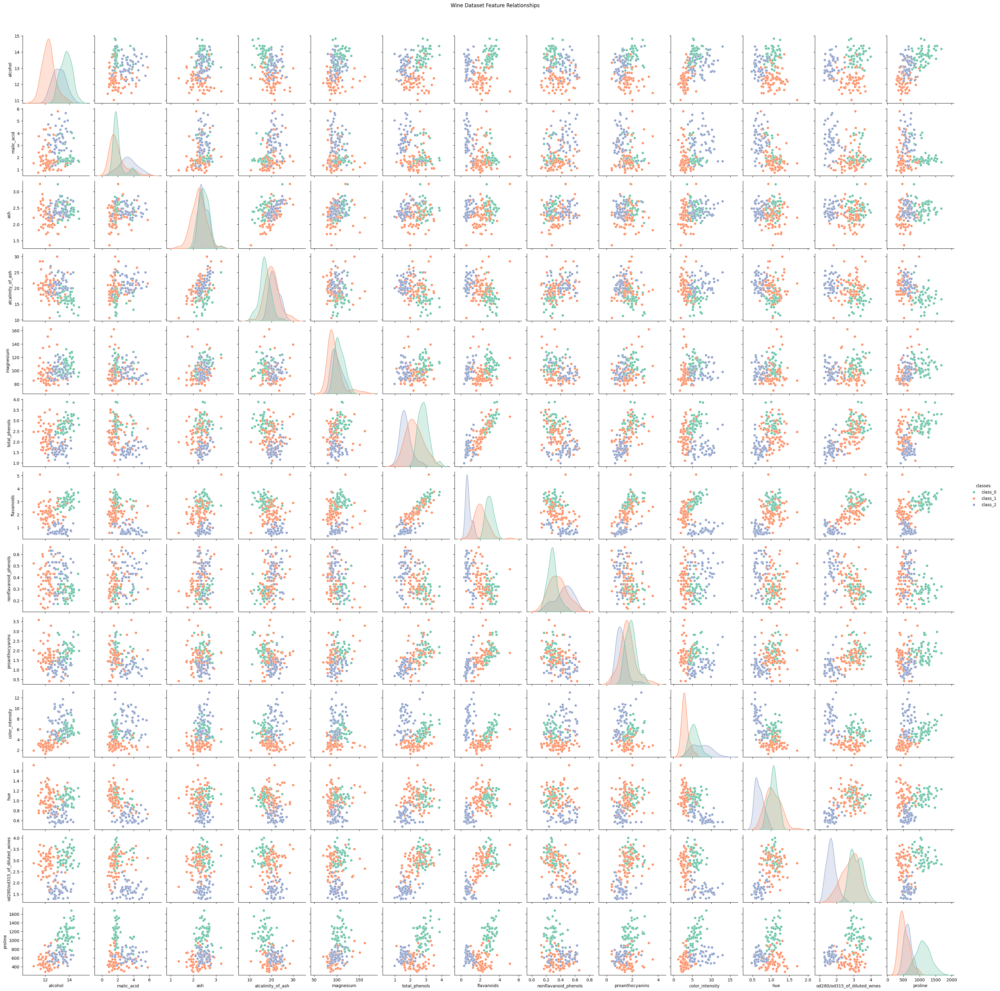

In [3]:
# Pairplot to visualize feature relationships
import matplotlib.pyplot as plt
import seaborn as sns

sns.pairplot(df, hue='classes', palette='Set2')
plt.suptitle("Wine Dataset Feature Relationships", y=1.02)
plt.show()

- We can see that some features are linearly separable while others aren't.

DIsplay the correlation matrix between features and target.

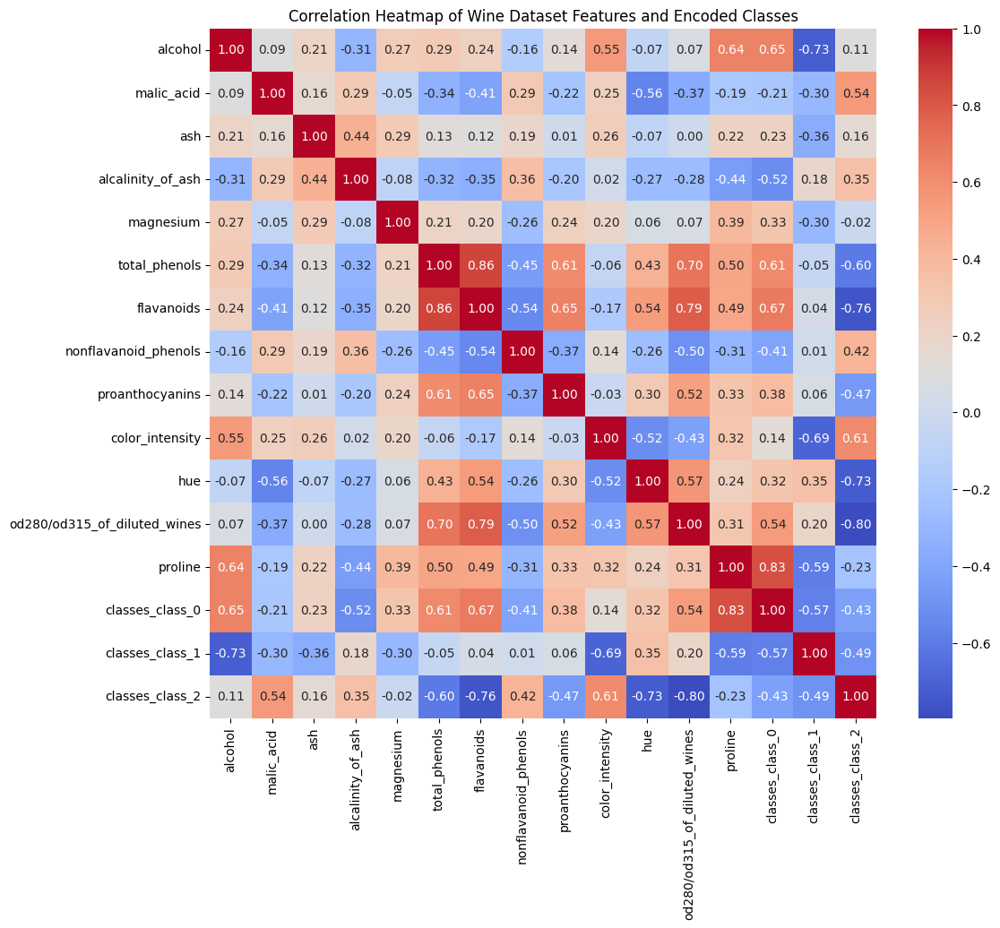

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd # Import pandas

# Calculate the correlation matrix
# One-hot encode the 'classes' column to include it in the correlation calculation
df_encoded = pd.get_dummies(df, columns=['classes'], drop_first=False)

# Calculate the correlation matrix on the encoded DataFrame
correlation_matrix = df_encoded.corr(numeric_only=True)

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Wine Dataset Features and Encoded Classes')
plt.show()

### Check for outliers

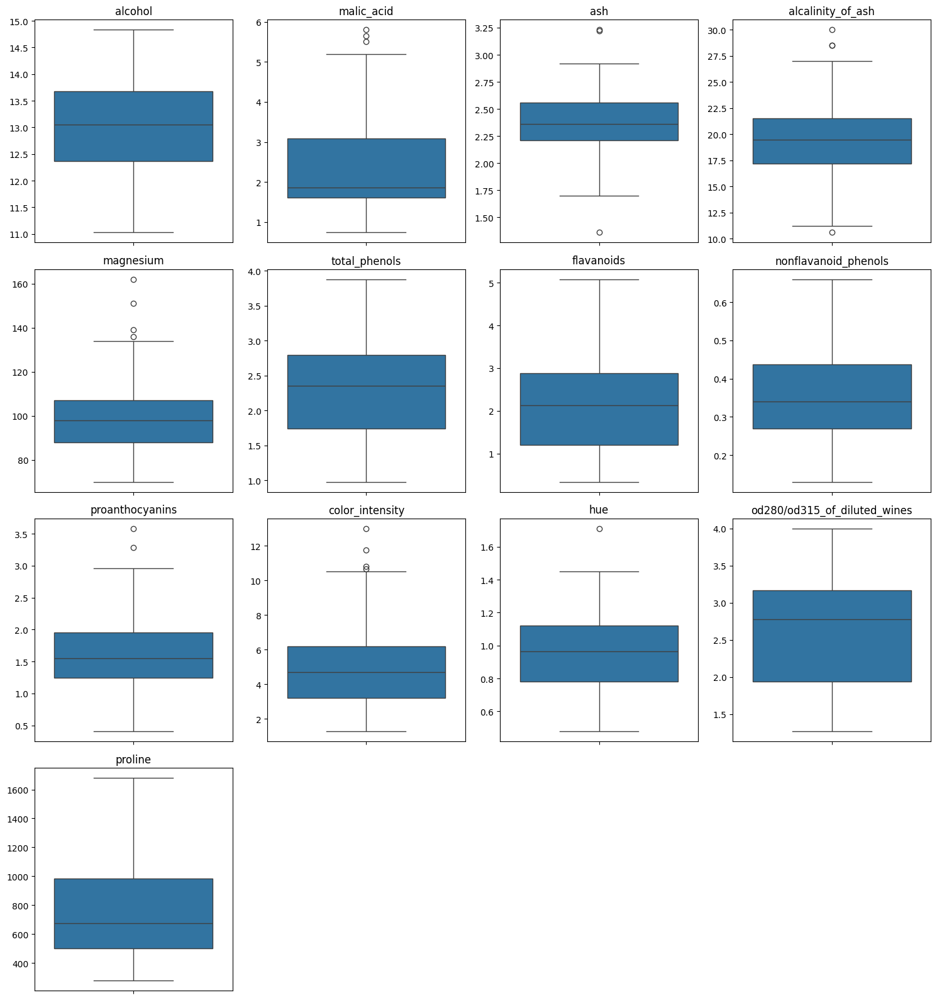

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select only the numerical features for box plots
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns

# Determine the grid size
n_features = len(numerical_features)
n_cols = 4  # Number of columns in the grid
n_rows = (n_features + n_cols - 1) // n_cols  # Calculate the number of rows

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 4))
axes = axes.flatten() # Flatten the 2D array of axes for easy iteration

# Create a box plot for each numerical feature
for i, col in enumerate(numerical_features):
    sns.boxplot(y=df[col], ax=axes[i])
    axes[i].set_title(col)
    axes[i].set_ylabel('') # Remove y-axis label for cleaner look

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

- There are some outliers for a few columns, but they do not seem unusual, so we leave them as they are.

### Split into train / validation / test sets

Split the data into training and testing sets and standardize the features using `StandardScaler`.

In [6]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.utils import to_categorical

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Scale features for better training
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# One-hot encode labels
y_train_cat = to_categorical(y_train)
y_test_cat = to_categorical(y_test)


### Use **k-fold cross-validation**
We will use k-fold cross-validation (e.g., 5-fold) on the training set to evaluate models more robustly.  


In [7]:
from sklearn.model_selection import KFold
import numpy as np
from tensorflow.keras.utils import to_categorical

# Define the number of folds
n_splits = 5

# Initialize KFold
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# We will use these lists to store results for each fold
fold_results = []

# Iterate over the folds
for fold, (train_index, val_index) in enumerate(kf.split(X_train)):
    print(f"--- Fold {fold+1}/{n_splits} ---")

    # Split the training data into training and validation sets for the current fold
    X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
    y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

    # One-hot encode labels for Keras
    y_train_fold_cat = to_categorical(y_train_fold)
    y_val_fold_cat = to_categorical(y_val_fold)


    print(f"Train set shape for fold {fold+1}: {X_train_fold.shape}")
    print(f"Validation set shape for fold {fold+1}: {X_val_fold.shape}")
    print(f"Train labels shape for fold {fold+1}: {y_train_fold_cat.shape}")
    print(f"Validation labels shape for fold {fold+1}: {y_val_fold_cat.shape}")

--- Fold 1/5 ---
Train set shape for fold 1: (113, 13)
Validation set shape for fold 1: (29, 13)
Train labels shape for fold 1: (113, 3)
Validation labels shape for fold 1: (29, 3)
--- Fold 2/5 ---
Train set shape for fold 2: (113, 13)
Validation set shape for fold 2: (29, 13)
Train labels shape for fold 2: (113, 3)
Validation labels shape for fold 2: (29, 3)
--- Fold 3/5 ---
Train set shape for fold 3: (114, 13)
Validation set shape for fold 3: (28, 13)
Train labels shape for fold 3: (114, 3)
Validation labels shape for fold 3: (28, 3)
--- Fold 4/5 ---
Train set shape for fold 4: (114, 13)
Validation set shape for fold 4: (28, 13)
Train labels shape for fold 4: (114, 3)
Validation labels shape for fold 4: (28, 3)
--- Fold 5/5 ---
Train set shape for fold 5: (114, 13)
Validation set shape for fold 5: (28, 13)
Train labels shape for fold 5: (114, 3)
Validation labels shape for fold 5: (28, 3)


- In the next steps, we will build, train, and evaluate the Keras model within the loop that iterates through each one of the 5 folds using `X_train_fold`, `y_train_fold_cat` for training and `X_val_fold`, `y_val_fold_cat` for validation.
- We will store the evaluation results for each fold in the `fold_results` array.

## **2. Build a baseline network**  
   - Use a simple MLP (1 hidden layer, e.g., 32 units, ReLU).  
   - Use the appropriate loss for the task you selected.  
   - Experiment with different architectures to improve performance compared to baseline

Define Activation Functions.

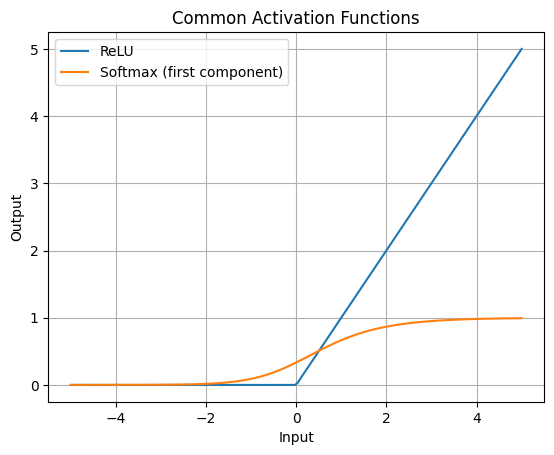

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Define activation functions
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def relu(x):
    return np.maximum(0, x)

def leaky_relu(x, alpha=0.1):
    return np.where(x >= 0, x, alpha * x)

def tanh(x):
    return np.tanh(x)

def linear(x):
    return x

def softmax(x):
    e_x = np.exp(x - np.max(x))  # for numerical stability
    return e_x / e_x.sum()

# Input values
x_vals = np.linspace(-5, 5, 200)

# For softmax, create a 2D example for visualization
softmax_vals = np.array([softmax(np.array([i, 0, -i]))[0] for i in x_vals])

# Plot all functions
# plt.figure(figsize=(10,6))
# plt.plot(x_vals, sigmoid(x_vals), label='Sigmoid')
plt.plot(x_vals, relu(x_vals), label='ReLU')
#plt.plot(x_vals, leaky_relu(x_vals), label='Leaky ReLU')
# plt.plot(x_vals, tanh(x_vals), label='Tanh')
#plt.plot(x_vals, linear(x_vals), label='Linear')
plt.plot(x_vals, softmax_vals, label='Softmax (first component)')

plt.title("Common Activation Functions")
plt.xlabel("Input")
plt.ylabel("Output")
plt.legend()
plt.grid(True)
plt.show()


We will use a simple MLP (1 hidden layer, e.g., 32 units, ReLU).

In [9]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam

# Define a simple feedforward network
model = Sequential([
    Input(shape=(X_train.shape[1],)), # Use Input layer to specify input shape
    Dense(32, activation='relu'),  # hidden layer with 32 units
    Dense(len(np.unique(y)), activation='softmax')  # output layer with number of classes from the data
])

print(model.summary())

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 32)             │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │            99 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 547 (2.14 KB)

 Trainable params: 547 (2.14 KB)

 Non-trainable params: 0 (0.00 B)

None


## **3. Training**  
   - Train with `SGD` or `Adam`.  
   - Plot **training and validation loss curves**.  

### Train the model with `Adam`

Train the model using all features.

--- Fold 1/5 ---
Fold 1 Evaluation: Loss = 0.0402, Accuracy = 0.9655
--- Visualizing Predictions for Fold 1 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


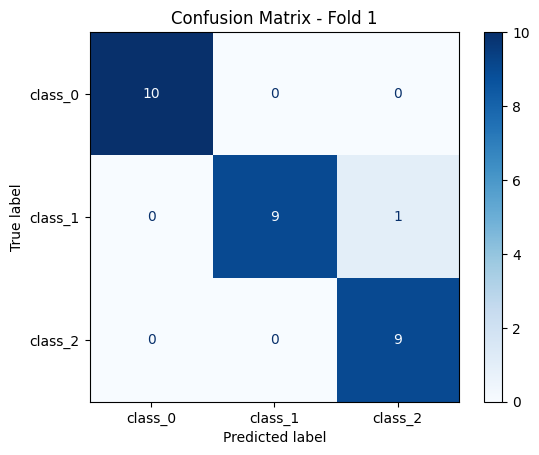

--- Fold 2/5 ---
Fold 2 Evaluation: Loss = 0.1093, Accuracy = 0.9655
--- Visualizing Predictions for Fold 2 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


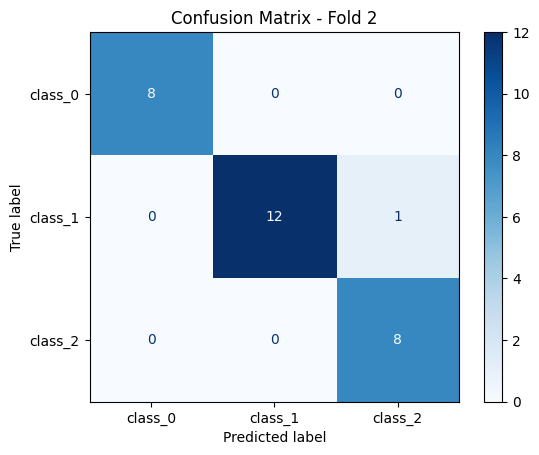

--- Fold 3/5 ---
Fold 3 Evaluation: Loss = 0.0023, Accuracy = 1.0000
--- Visualizing Predictions for Fold 3 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


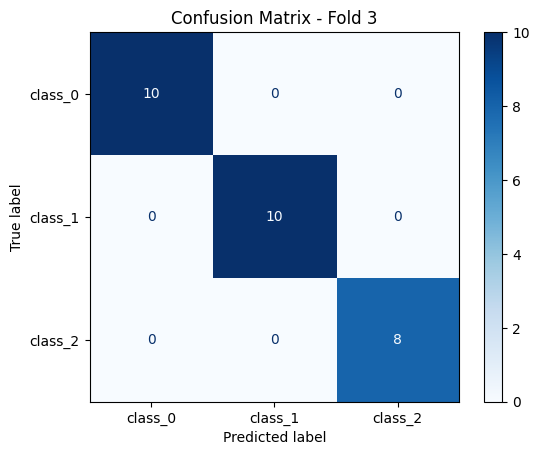

--- Fold 4/5 ---
Fold 4 Evaluation: Loss = 0.0005, Accuracy = 1.0000
--- Visualizing Predictions for Fold 4 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


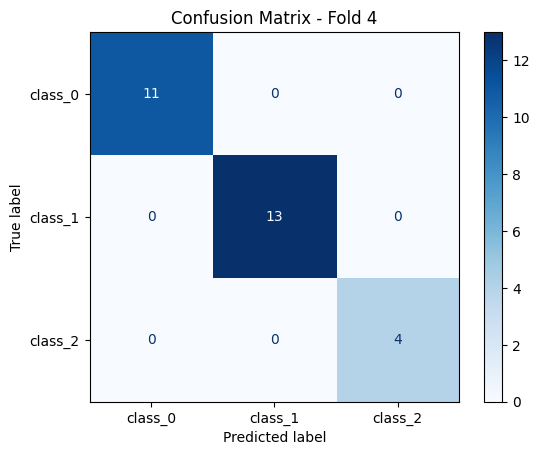

--- Fold 5/5 ---


Fold 5 Evaluation: Loss = 0.0013, Accuracy = 1.0000
--- Visualizing Predictions for Fold 5 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


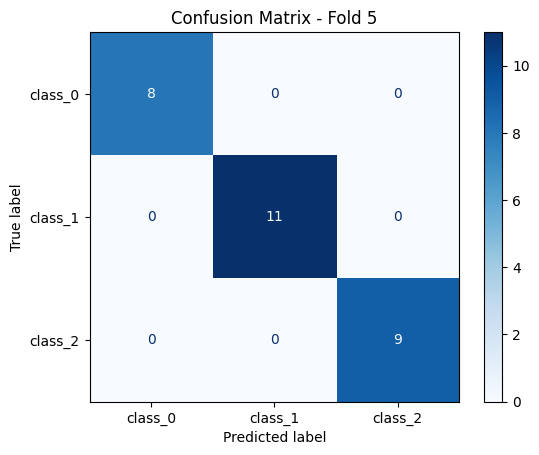

In [10]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Define training parameters
num_epochs = 100
learning_rate = 0.01

# Lists to store training history for each fold
fold_histories = []
fold_val_losses = [] # To store final validation loss for each fold
fold_val_accuracies = [] # To store final validation accuracy for each fold

# Iterate over the folds
for fold, (train_index, val_index) in enumerate(kf.split(X_train)):
    print(f"--- Fold {fold+1}/{n_splits} ---")

    # Split the training data into training and validation sets for the current fold
    X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
    y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

    # One-hot encode labels for Keras
    y_train_fold_cat = to_categorical(y_train_fold)
    y_val_fold_cat = to_categorical(y_val_fold)

    # Instantiate a new model for this fold
    model = Sequential([
        Input(shape=(X_train.shape[1],)), # Use Input layer to specify input shape
        Dense(32, activation='relu'),  # hidden layer with 32 units as per task
        Dense(len(np.unique(y)), activation='softmax')  # output layer with number of classes from the data
    ])

    # Compile model
    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    # Train model
    history = model.fit(X_train_fold, y_train_fold_cat,
                        validation_data=(X_val_fold, y_val_fold_cat),
                        epochs=num_epochs,
                        verbose=0)

    # Store history and final validation loss/accuracy for this fold
    fold_histories.append(history)
    fold_val_losses.append(history.history['val_loss'][-1])
    fold_val_accuracies.append(history.history['val_accuracy'][-1]) # Store final validation accuracy

    # Print evaluation for the current fold on its validation set
    loss, accuracy = model.evaluate(X_val_fold, y_val_fold_cat, verbose=0)
    print(f"Fold {fold+1} Evaluation: Loss = {loss:.4f}, Accuracy = {accuracy:.4f}")

    # Add Confusion Matrix Plotting
    print(f"--- Visualizing Predictions for Fold {fold+1} ---")
    y_pred_prob = model.predict(X_val_fold)
    y_pred = np.argmax(y_pred_prob, axis=1)

    # Get actual class names for display labels
    actual_val_labels = np.argmax(y_val_fold_cat, axis=1) # Convert one-hot back to class index
    target_names = wine.target_names

    cm = confusion_matrix(actual_val_labels, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names)
    disp.plot(cmap='Blues')
    plt.title(f"Confusion Matrix - Fold {fold+1}")
    plt.show()

We observe from the final validation losses and accuracy of each fold that they vary:
- Folds 3, 4, and 5 have very low final validation losses (close to zero), suggesting the model performed exceptionally well on those validation sets.
- Fold 1 has a slightly higher loss, and Fold 2 has the highest loss, meaning that the first 2 folds perform worse than the last 3.
- Folds 1, 3, 4, 5 have an accuracy of 1, while Fold 2 has an accuracy of 0.9655, which is a very good accuracy, suggesting that the model is either performing very well or it might be overfitted.


We observe from the confusion matrix of each fold that the folds 3, 4 and 5 predict the results of the classes perfectly.

In [11]:
# Calculate and print average validation loss and accuracy across all folds
average_validation_loss = np.mean(fold_val_losses)
average_validation_accuracy = np.mean(fold_val_accuracies)
print(f"\nAverage Validation Loss across folds: {average_validation_loss:.4f}")
print(f"Average Validation Accuracy across folds: {average_validation_accuracy:.4f}")


Average Validation Loss across folds: 0.0307
Average Validation Accuracy across folds: 0.9862


- The avergae validation loss across all folds is pretty low, meaning that the model is generally performing well.
- The average validation accuracy is very close to 1, meaning the model is predicting very well, or it might be overfitted.

#### Plot training and validation loss curves

Plot training loss curve.

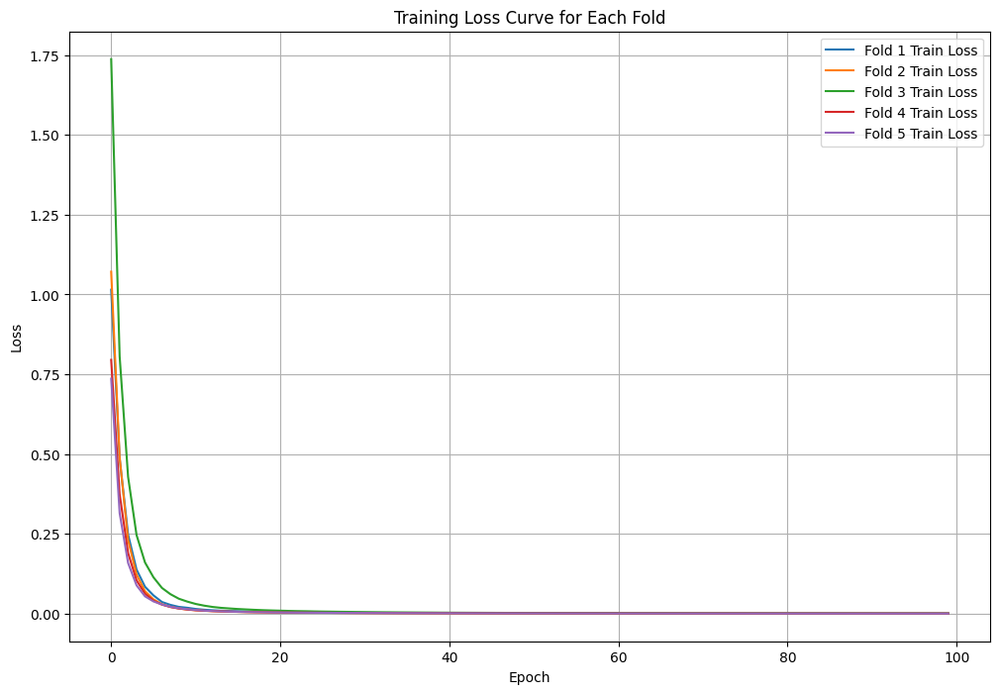

In [12]:
# Plot training loss curve for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories):
    plt.plot(history.history['loss'], label=f'Fold {fold+1} Train Loss')

plt.title('Training Loss Curve for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

Plot validation loss curve.

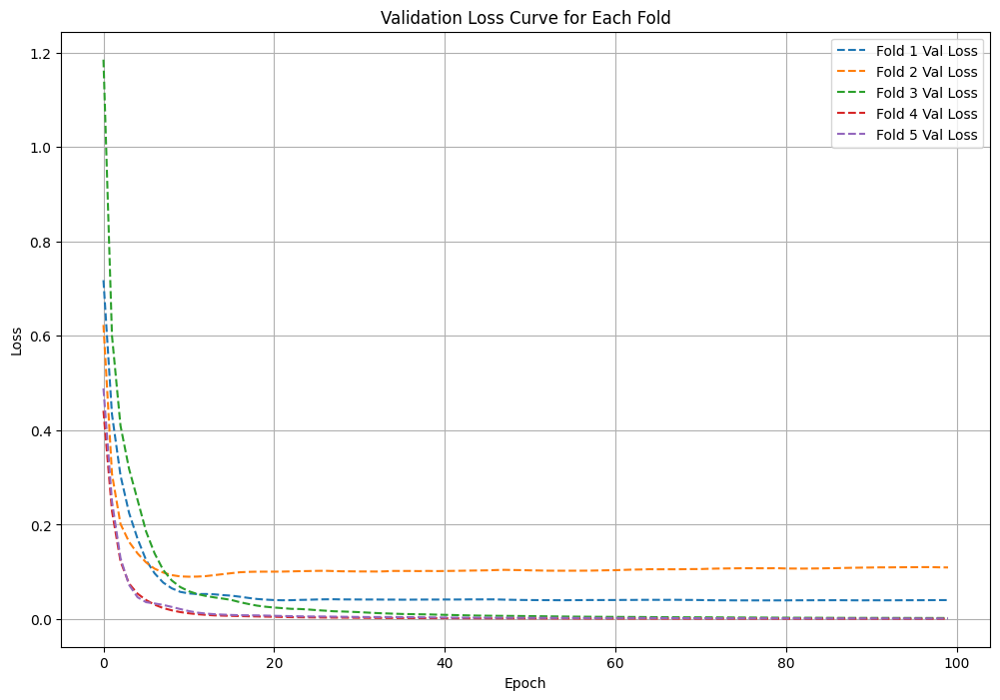

In [13]:
# Plot validation loss curve for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories):
    plt.plot(history.history['val_loss'], label=f'Fold {fold+1} Val Loss', linestyle='--')

plt.title('Validation Loss Curve for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

We observe from the training and validation loss curves plots that:
- For Folds 1 and 2 the training loss continues to decrease, but the validation loss starts to increase at one point -> slight overfitting, as the curves generally continue to decrease
- For Folds 3, 4, 5, both the training and validation losses continue to decrease -> the model is learning and generalizing well

#### Plot training and validation accuracy curves

Plot train accuracy curves.

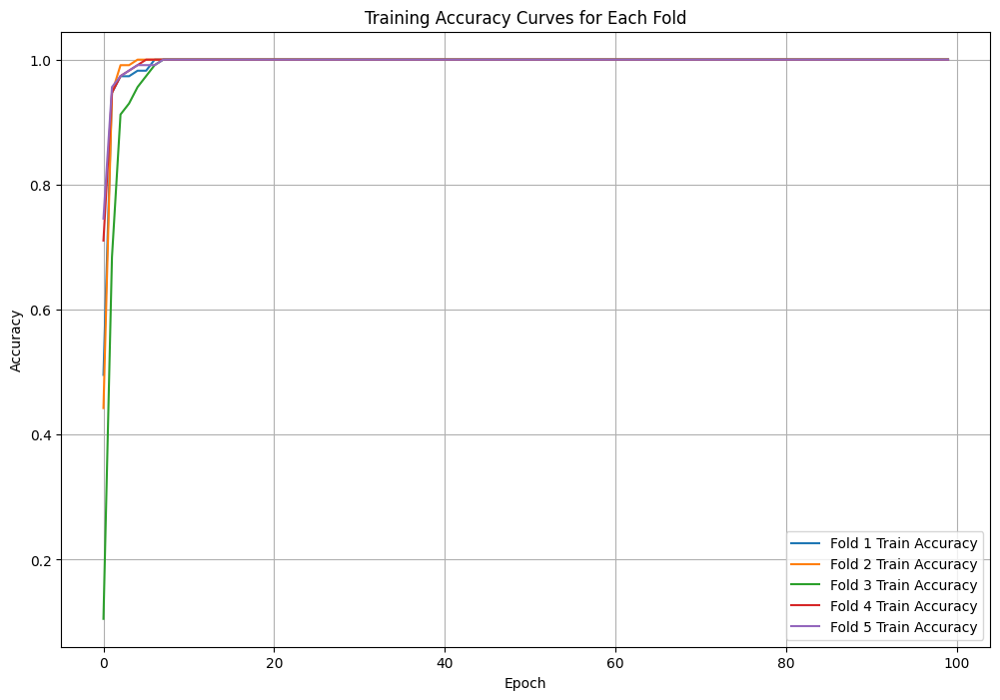

In [14]:
# Plot training accuracy curves for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories):
    plt.plot(history.history['accuracy'], label=f'Fold {fold+1} Train Accuracy')

plt.title('Training Accuracy Curves for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

Plot validation accuracy curves.

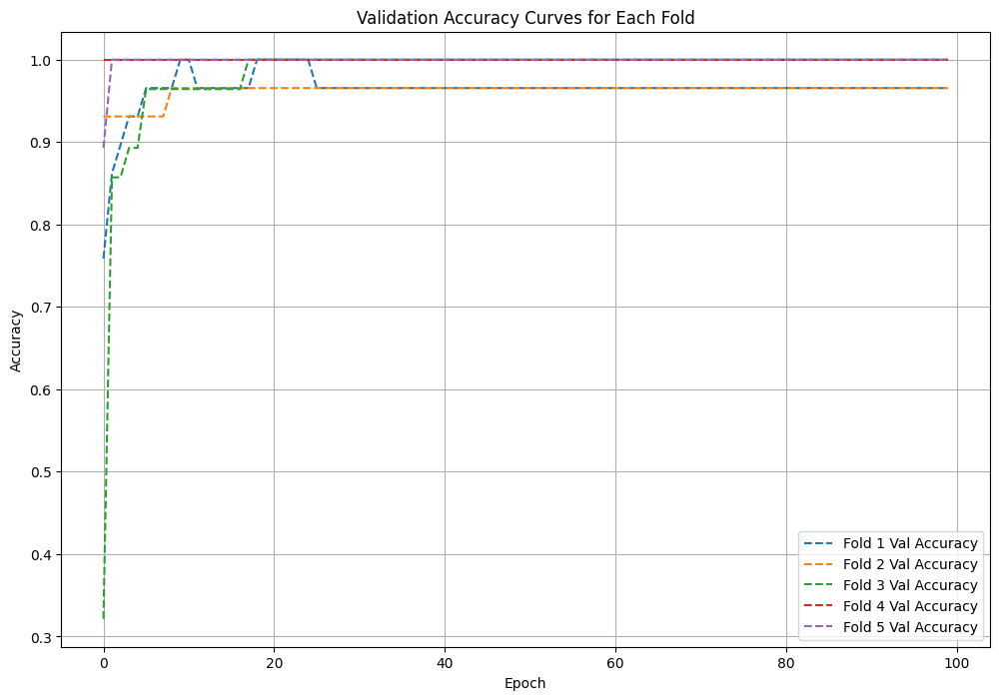

In [15]:
# Plot validation accuracy curves for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories):
    plt.plot(history.history['val_accuracy'], label=f'Fold {fold+1} Val Accuracy', linestyle='--')

plt.title('Validation Accuracy Curves for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

#### Visualise predictions of the model

Instantiate the final model.

In [16]:
final_model = Sequential([
    Input(shape=(X_train.shape[1],)), # Use Input layer to specify input shape
    Dense(32, activation='relu'),  # Using 32 units as in the baseline
    Dense(len(np.unique(y)), activation='softmax') # Output layer
])

Compile the model using `Adam`.

In [17]:
final_model.compile(optimizer=Adam(learning_rate=0.01),
                    loss='categorical_crossentropy',
                    metrics=['accuracy'])

Train the model on full training data.

In [18]:
history_final = final_model.fit(X_train, y_train_cat,
                                epochs=100,
                                verbose=1) # Show training progress


Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.6070 - loss: 0.9141  
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8705 - loss: 0.4243
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9736 - loss: 0.2115 
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9832 - loss: 0.1168 
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9736 - loss: 0.0868 
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9736 - loss: 0.0514 
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 1.0000 - loss: 0.0258 
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 1.0000 - loss: 0.0273 
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 1.0000 - loss: 0.0148 
Epoch 10/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 1.0000 - loss: 0.0148 
Epoch 11/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 1.0000 - loss: 0.0107
Epoch 12/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 1.0000 - lo

Evaluate the model.

In [19]:
# Use the scaled test features (X_test) and one-hot encoded test labels (y_test_cat)
test_loss, test_accuracy = final_model.evaluate(X_test, y_test_cat, verbose=0)

print(f"Final Model Test Loss: {test_loss:.4f}")
print(f"Final Model Test Accuracy: {test_accuracy:.4f}")

Final Model Test Loss: 0.0953
Final Model Test Accuracy: 0.9722


Visualize the classification report.

In [20]:
# Evaluate on test data
from sklearn.metrics import classification_report
import numpy as np

# Predict probabilities on the test set
y_pred_prob_test = final_model.predict(X_test)
# Get predicted class labels
y_pred_test = np.argmax(y_pred_prob_test, axis=1)

target_names = wine.target_names

print(classification_report(y_test, y_pred_test, target_names=target_names))

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
              precision    recall  f1-score   support

     class_0       1.00      1.00      1.00        12
     class_1       0.93      1.00      0.97        14
     class_2       1.00      0.90      0.95        10

    accuracy                           0.97        36
   macro avg       0.98      0.97      0.97        36
weighted avg       0.97      0.97      0.97        36



Plot training and validation loss.

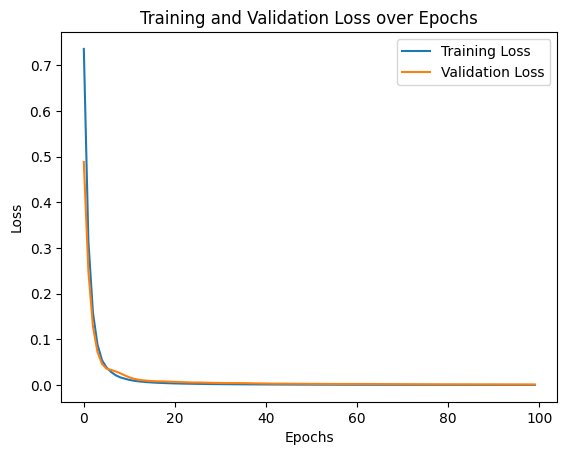

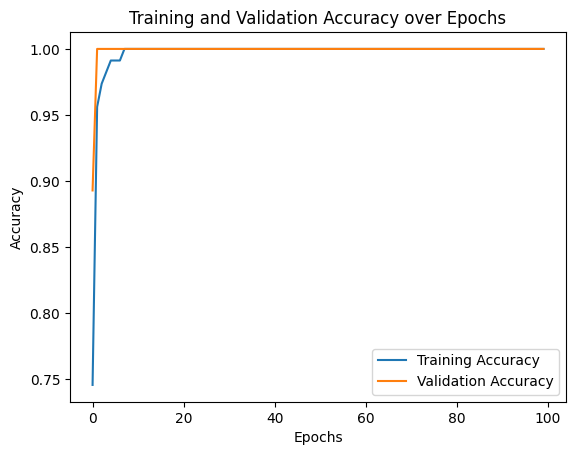

In [21]:
# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss over Epochs')
plt.legend()
plt.show()

# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy over Epochs')
plt.legend()
plt.show()

Visualize the confusion matrix.

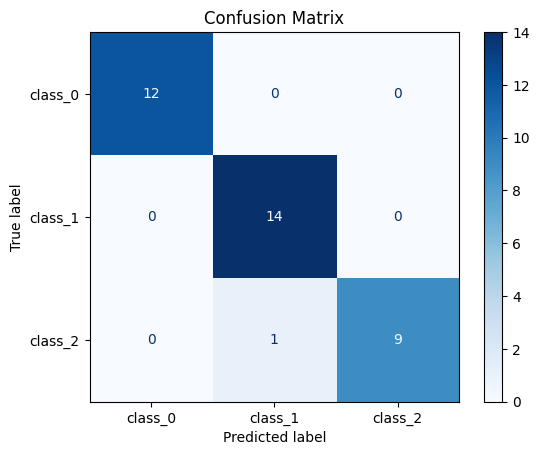

In [22]:
cm_test = confusion_matrix(y_test, y_pred_test)
disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=target_names)
disp_test.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

**Conclusions:**
- The final model trained on the full training dataset with the Adam optimizer and the simple architecture appears to perform exceptionally well on the unseen test set.
-  The high values for accuracy, precision, recall, and F1-scores for each class, supported by the confusion matrix, indicate that the model is effectively distinguishing between the three classes of wine.
- We can see that there is a minor misclassification that occurs between Class 1 and Class 2 from both the classification report and the confusion matrix.

### Traing the model with `SGD`

--- Fold 1/5 ---
Fold 1 Evaluation: Loss = 0.0834, Accuracy = 0.9655
--- Visualizing Predictions for Fold 1 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


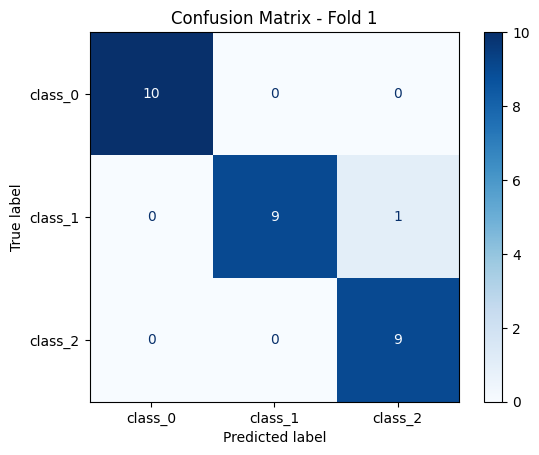

--- Fold 2/5 ---
Fold 2 Evaluation: Loss = 0.1231, Accuracy = 0.9310
--- Visualizing Predictions for Fold 2 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


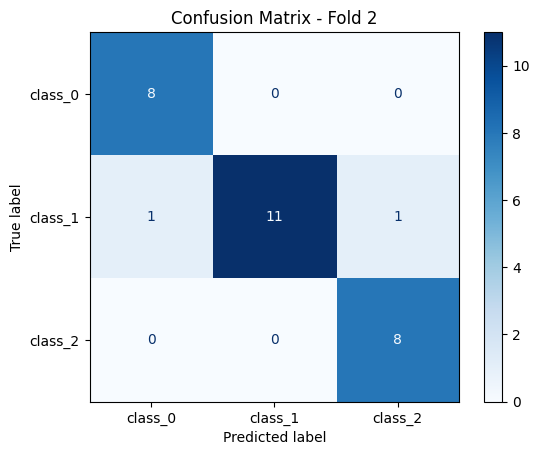

--- Fold 3/5 ---
Fold 3 Evaluation: Loss = 0.0239, Accuracy = 1.0000
--- Visualizing Predictions for Fold 3 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


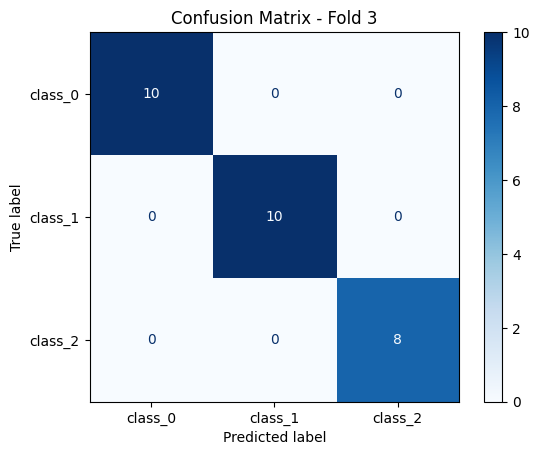

--- Fold 4/5 ---
Fold 4 Evaluation: Loss = 0.0139, Accuracy = 1.0000
--- Visualizing Predictions for Fold 4 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


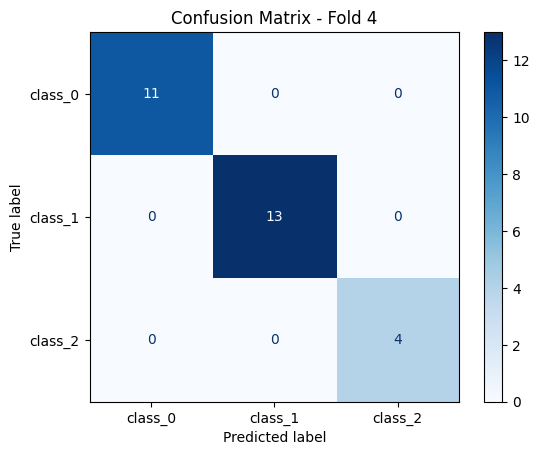

--- Fold 5/5 ---
Fold 5 Evaluation: Loss = 0.0089, Accuracy = 1.0000
--- Visualizing Predictions for Fold 5 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


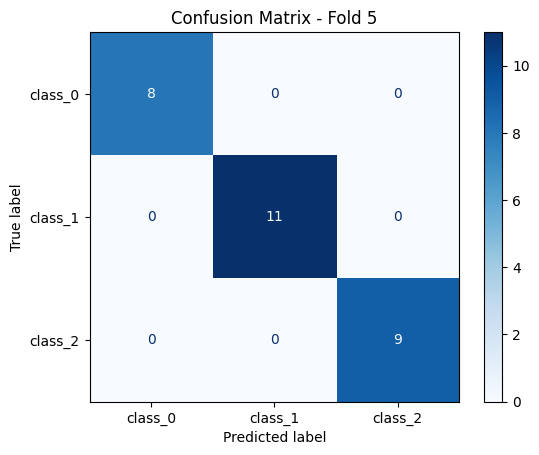

In [23]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import SGD
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Define training parameters
num_epochs = 100
learning_rate = 0.01

# Lists to store training history for each fold
fold_histories = []
fold_val_losses = [] # To store final validation loss for each fold
fold_val_accuracies = [] # To store final validation accuracy for each fold

# Iterate over the folds
for fold, (train_index, val_index) in enumerate(kf.split(X_train)):
    print(f"--- Fold {fold+1}/{n_splits} ---")

    # Split the training data into training and validation sets for the current fold
    X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
    y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

    # One-hot encode labels for Keras
    y_train_fold_cat = to_categorical(y_train_fold)
    y_val_fold_cat = to_categorical(y_val_fold)

    # Instantiate a new model for this fold
    model = Sequential([
        Input(shape=(X_train.shape[1],)), # Use Input layer to specify input shape
        Dense(32, activation='relu'),  # hidden layer with 32 units as per task
        Dense(len(np.unique(y)), activation='softmax')  # output layer with number of classes from the data
    ])

    # Compile model
    model.compile(optimizer=SGD(learning_rate=learning_rate, momentum=0.9),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    # Train model
    history = model.fit(X_train_fold, y_train_fold_cat,
                        validation_data=(X_val_fold, y_val_fold_cat),
                        epochs=num_epochs,
                        verbose=0)

    # Store history and final validation loss/accuracy for this fold
    fold_histories.append(history)
    fold_val_losses.append(history.history['val_loss'][-1])
    fold_val_accuracies.append(history.history['val_accuracy'][-1]) # Store final validation accuracy

    # Print evaluation for the current fold on its validation set
    loss, accuracy = model.evaluate(X_val_fold, y_val_fold_cat, verbose=0)
    print(f"Fold {fold+1} Evaluation: Loss = {loss:.4f}, Accuracy = {accuracy:.4f}")

    # Add Confusion Matrix Plotting
    print(f"--- Visualizing Predictions for Fold {fold+1} ---")
    y_pred_prob = model.predict(X_val_fold)
    y_pred = np.argmax(y_pred_prob, axis=1)

    # Get actual class names for display labels
    actual_val_labels = np.argmax(y_val_fold_cat, axis=1) # Convert one-hot back to class index
    target_names = wine.target_names

    cm = confusion_matrix(actual_val_labels, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names)
    disp.plot(cmap='Blues')
    plt.title(f"Confusion Matrix - Fold {fold+1}")
    plt.show()

We observe from the final validation losses that:
- All 5 folds have a validation loss between 0.12 and 0.2, with Fold 2 having the smallest loss
- The accuracy of all 5 folds is very close to 1, with Folds 1, 4 and 5 having a perfect accuracy

In [24]:
# Calculate and print average validation loss and accuracy across all folds
average_validation_loss_sgd = np.mean(fold_val_losses)
average_validation_accuracy_sgd = np.mean(fold_val_accuracies)
print(f"\nAverage Validation Loss across folds: {average_validation_loss_sgd:.4f}")
print(f"Average Validation Accuracy across folds: {average_validation_accuracy_sgd:.4f}")


Average Validation Loss across folds: 0.0506
Average Validation Accuracy across folds: 0.9793


- The average validation loss is not so big, but it is bigger than the average validation loss of the model trained with `Adam`.
- The average validation accuracy is very close to 1

#### Plot training and validation loss curves.

Plot training loss curve.

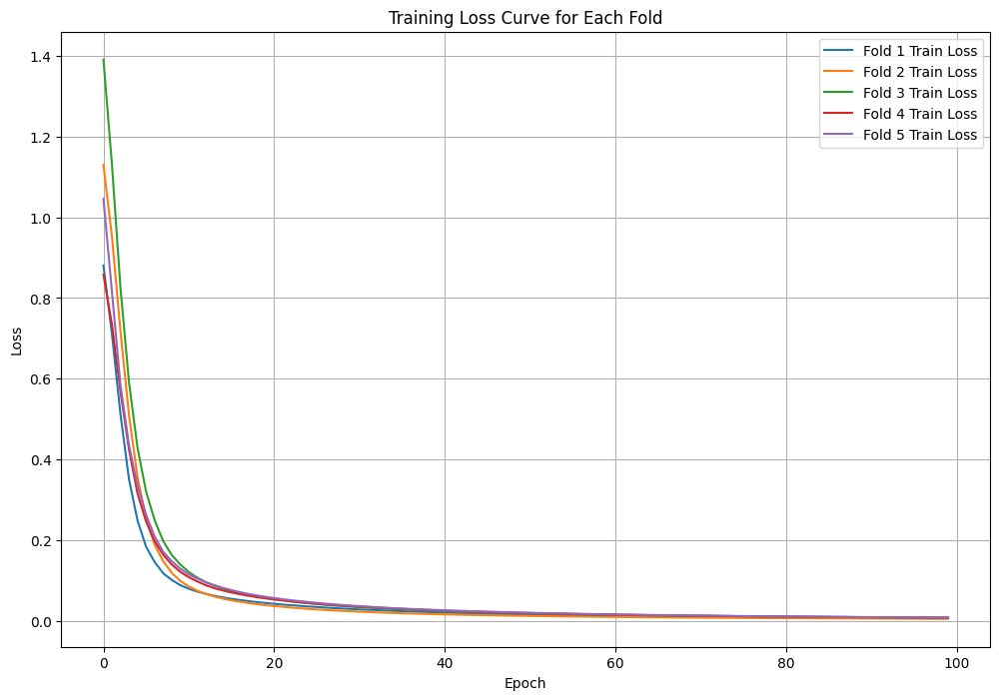

In [25]:
# Plot training loss curve for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories):
    plt.plot(history.history['loss'], label=f'Fold {fold+1} Train Loss')

plt.title('Training Loss Curve for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

Plot validation loss curve.

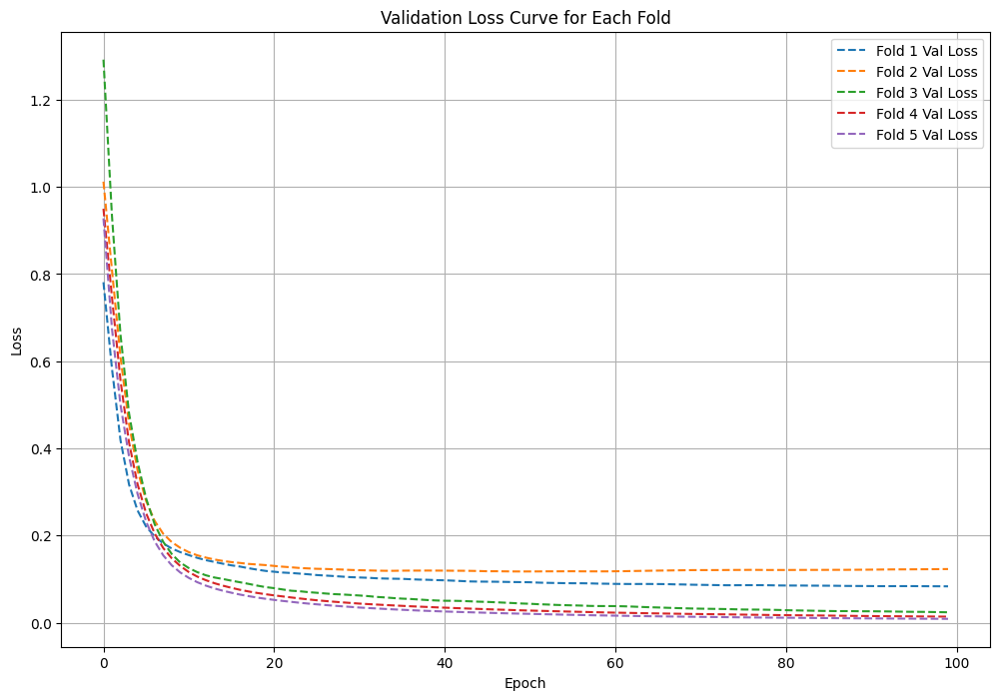

In [26]:
# Plot validation loss curve for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories):
    plt.plot(history.history['val_loss'], label=f'Fold {fold+1} Val Loss', linestyle='--')

plt.title('Validation Loss Curve for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

We observe from the training and validation loss curves plots that:
- All folds curves decrease and none of them start increasing at some point, so the model is not overfitted
- Compared to the model trained with Adam, where the decrease is more abrupt, here the curves are decreasing smoothly



#### Plot training and validation accuracy curves

Plot train accuracy curves.

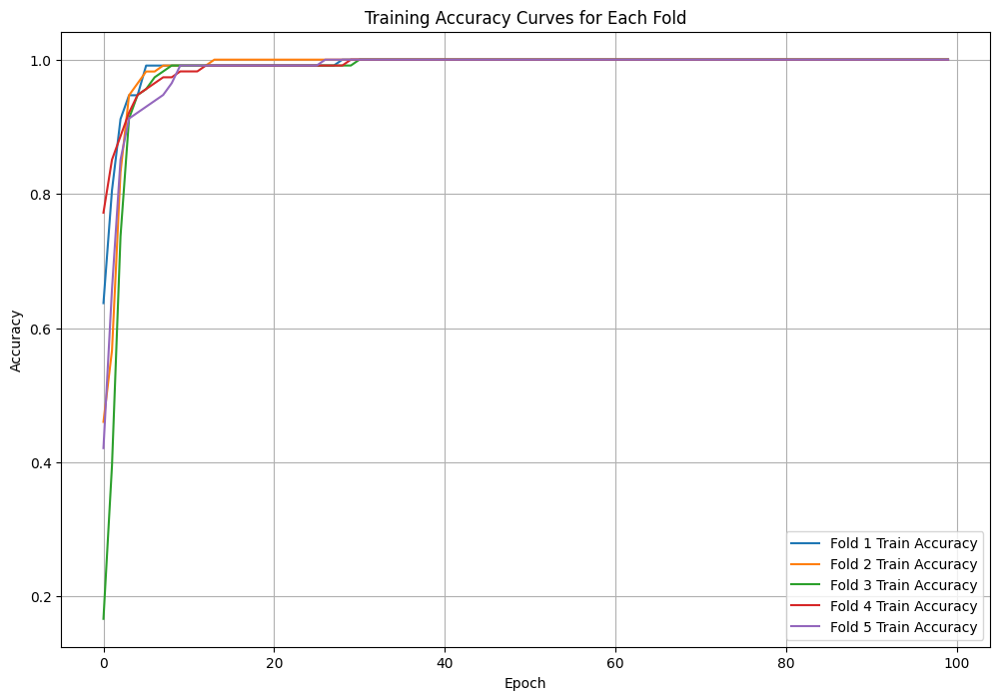

In [27]:
# Plot training accuracy curves for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories):
    plt.plot(history.history['accuracy'], label=f'Fold {fold+1} Train Accuracy')

plt.title('Training Accuracy Curves for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

Plot validation accuracy curves.

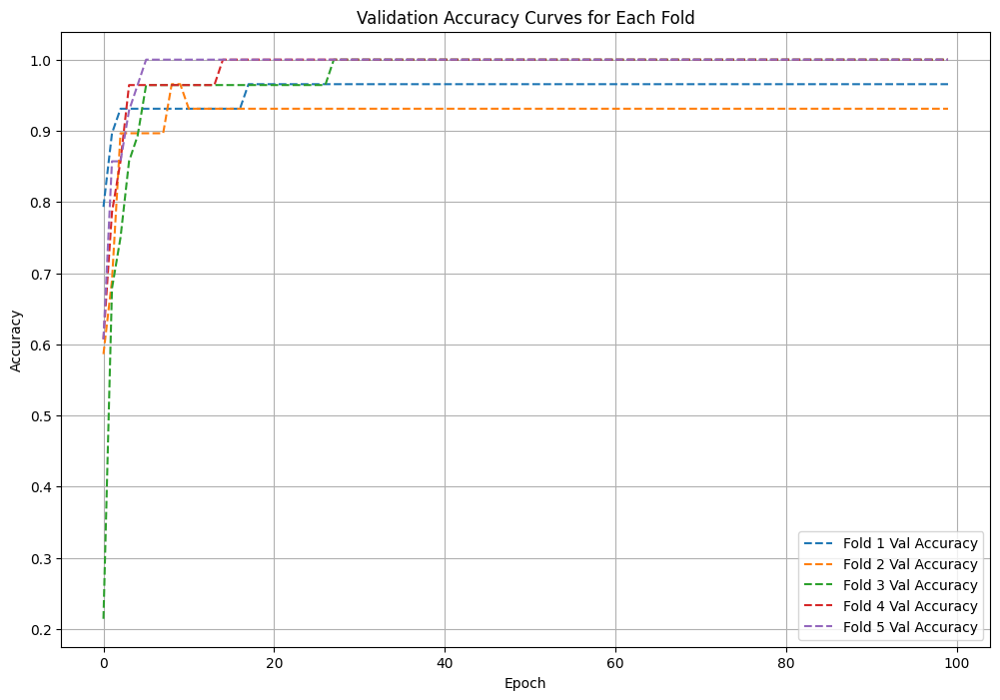

In [28]:
# Plot validation accuracy curves for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories):
    plt.plot(history.history['val_accuracy'], label=f'Fold {fold+1} Val Accuracy', linestyle='--')

plt.title('Validation Accuracy Curves for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

#### Visualise predictions of the model

Instantiate the final model.

In [29]:
final_model_sgd = Sequential([
    Input(shape=(X_train.shape[1],)), # Use Input layer to specify input shape
    Dense(32, activation='relu'),  # Using 32 units as in the baseline
    Dense(len(np.unique(y)), activation='softmax') # Output layer
])

Compile the model using `SGD`.

In [30]:
final_model_sgd.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9),
                    loss='categorical_crossentropy',
                    metrics=['accuracy'])

Train the model on full training data.

In [31]:
history_final = final_model_sgd.fit(X_train, y_train_cat,
                                epochs=100,
                                verbose=1) # Show training progress


Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.4708 - loss: 1.0253  
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7058 - loss: 0.7655 
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8740 - loss: 0.5167 
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9301 - loss: 0.3544 
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9607 - loss: 0.2447 
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9568 - loss: 0.1863 
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9644 - loss: 0.1463 
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9724 - loss: 0.1332 
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9780 - loss: 0.0971 
Epoch 10/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9788 - loss: 0.1023 
Epoch 11/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9788 - loss: 0.0900 
Epoch 12/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9736 - lo

Evaluate the model.

In [32]:
# Use the scaled test features (X_test) and one-hot encoded test labels (y_test_cat)
test_loss_sgd, test_accuracy_sgd = final_model_sgd.evaluate(X_test, y_test_cat, verbose=0)

print(f"Final Model Test Loss: {test_loss_sgd:.4f}")
print(f"Final Model Test Accuracy: {test_accuracy_sgd:.4f}")

Final Model Test Loss: 0.0989
Final Model Test Accuracy: 0.9444


Visualize the classification report.

In [33]:
# Predict probabilities on the test set
y_pred_prob_test = final_model_sgd.predict(X_test)
# Get predicted class labels
y_pred_test_sgd = np.argmax(y_pred_prob_test, axis=1)

target_names = wine.target_names

print(classification_report(y_test, y_pred_test_sgd, target_names=target_names))

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
              precision    recall  f1-score   support

     class_0       0.92      1.00      0.96        12
     class_1       0.93      0.93      0.93        14
     class_2       1.00      0.90      0.95        10

    accuracy                           0.94        36
   macro avg       0.95      0.94      0.95        36
weighted avg       0.95      0.94      0.94        36



Plot training an validation loss.

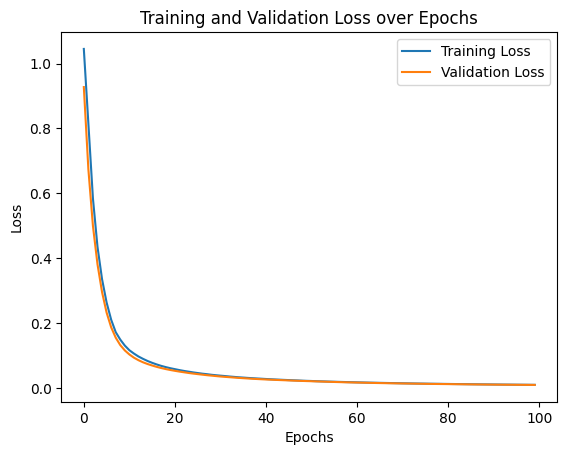

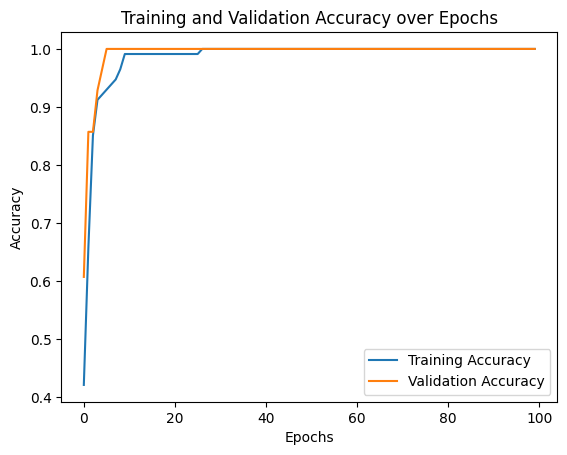

In [34]:
# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss over Epochs')
plt.legend()
plt.show()

# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy over Epochs')
plt.legend()
plt.show()


Visualize the confusion matrix.

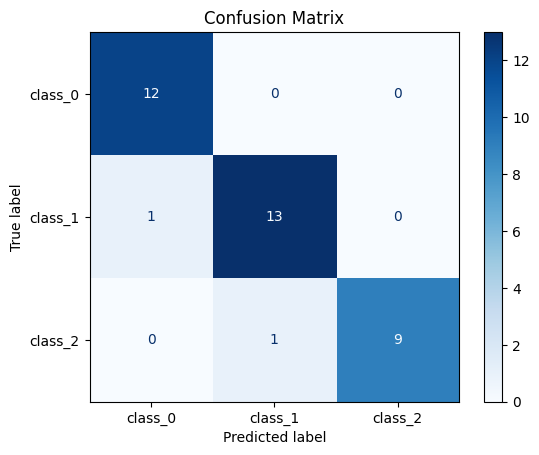

In [35]:
cm_test = confusion_matrix(y_test, y_pred_test_sgd)
disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=target_names)
disp_test.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

**Conclusions:**
- The final model trained on the full training dataset with the SGD optimizer and the simple architecture appears to perform exceptionally well on the unseen test set.
-  The high values for accuracy, precision, recall, and F1-scores for each class, supported by the confusion matrix, indicate that the model is effectively distinguishing between the three classes of wine.
- We evaluated different runs for the model trained with the SGD optimizer and we got different results, from 3 misclassifications to none misclassification.

### Compare Optimizers `SGD` and `Adam`

We can see that the simple architecture models trained above, one with `Adam` and one with `SGD` separately, both perform extremly well on the test set. The `Adam` optimizer model could be overfitted in 2 / 5 folds, but the `SGD` optimizer model doesn't show any signs of overfitting., but it showed different results for different runs on the same architecture.

**In colcusion**, the `SGD` model manages to achieve a perfect accuracy but also a poorer accuracy based on the random training subset, while the `Adam` model has a very good and consistent accuracy with only one misclassification.

## **4. Experiment: Overfitting**  
   - Make your model larger (e.g., 4 hidden layers with more units).  
   - Show whether the model overfits (compare train vs val losses across folds).  

### Train a large model with `Adam`

Create a function that builds a larger model with 4 hidden layers with more units (32 and 64).

In [36]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input

def build_larger_model():
  model_large = Sequential([
      Input(shape=(X_train.shape[1],)),
      Dense(32, activation='relu'), # Added hidden layer 1
      Dense(64, activation='relu'), # Added hidden layer 2
      Dense(64, activation='relu'), # Added hidden layer 3
      Dense(32, activation='relu'), # Added hidden layer 4
      Dense(len(np.unique(y)), activation='softmax')
  ])
  return model_large

Use K-Fold Cross-Validation with 5 folds.

In [37]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold

# Define the number of folds
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# Define training parameters
num_epochs = 200 # Increase epochs to see overfitting clearly
learning_rate = 0.001 # Use a smaller learning rate for a larger model

# Lists to store training history for each fold
fold_histories_large = []
fold_val_losses_large = [] # To store final validation loss for each fold
fold_val_accuracies_large = [] # To store final validation accuracy for each fold


# Iterate over the folds
for fold, (train_index, val_index) in enumerate(kf.split(X_train)):
    print(f"--- Fold {fold+1}/{n_splits} ---")

    # Split the training data into training and validation sets for the current fold
    X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
    y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

    # One-hot encode labels for Keras
    y_train_fold_cat = to_categorical(y_train_fold)
    y_val_fold_cat = to_categorical(y_val_fold)

    # Instantiate a larger model for this fold
    model_large = build_larger_model()

    # Compile model
    model_large.compile(optimizer=Adam(learning_rate=learning_rate),
                        loss='categorical_crossentropy',
                        metrics=['accuracy'])

    # Train model
    history_large = model_large.fit(X_train_fold, y_train_fold_cat,
                                    validation_data=(X_val_fold, y_val_fold_cat),
                                    epochs=num_epochs,
                                    verbose=0)

    # Store history and final validation loss/accuracy for this fold
    fold_histories_large.append(history_large)
    fold_val_losses_large.append(history_large.history['val_loss'][-1])
    fold_val_accuracies_large.append(history_large.history['val_accuracy'][-1]) # Store final validation accuracy

    # Print evaluation for the current fold on its validation set
    loss, accuracy = model_large.evaluate(X_val_fold, y_val_fold_cat, verbose=0)
    print(f"Fold {fold+1} Evaluation: Loss = {loss:.4f}, Accuracy = {accuracy:.4f}")


--- Fold 1/5 ---
Fold 1 Evaluation: Loss = 0.1929, Accuracy = 0.9655
--- Fold 2/5 ---
Fold 2 Evaluation: Loss = 0.1784, Accuracy = 0.9655
--- Fold 3/5 ---
Fold 3 Evaluation: Loss = 0.0045, Accuracy = 1.0000
--- Fold 4/5 ---
Fold 4 Evaluation: Loss = 0.0013, Accuracy = 1.0000
--- Fold 5/5 ---
Fold 5 Evaluation: Loss = 0.0014, Accuracy = 1.0000


Calculate and print average validation loss and accuracy across all folds.

In [38]:
average_validation_loss_large = np.mean(fold_val_losses_large)
average_validation_accuracy_large = np.mean(fold_val_accuracies_large)
print(f"\nAverage Validation Loss across folds: {average_validation_loss_large:.4f}")
print(f"Average Validation Accuracy across folds: {average_validation_accuracy_large:.4f}")


Average Validation Loss across folds: 0.0757
Average Validation Accuracy across folds: 0.9862


#### Plot training and validation loss curves.

Plot training loss curve.

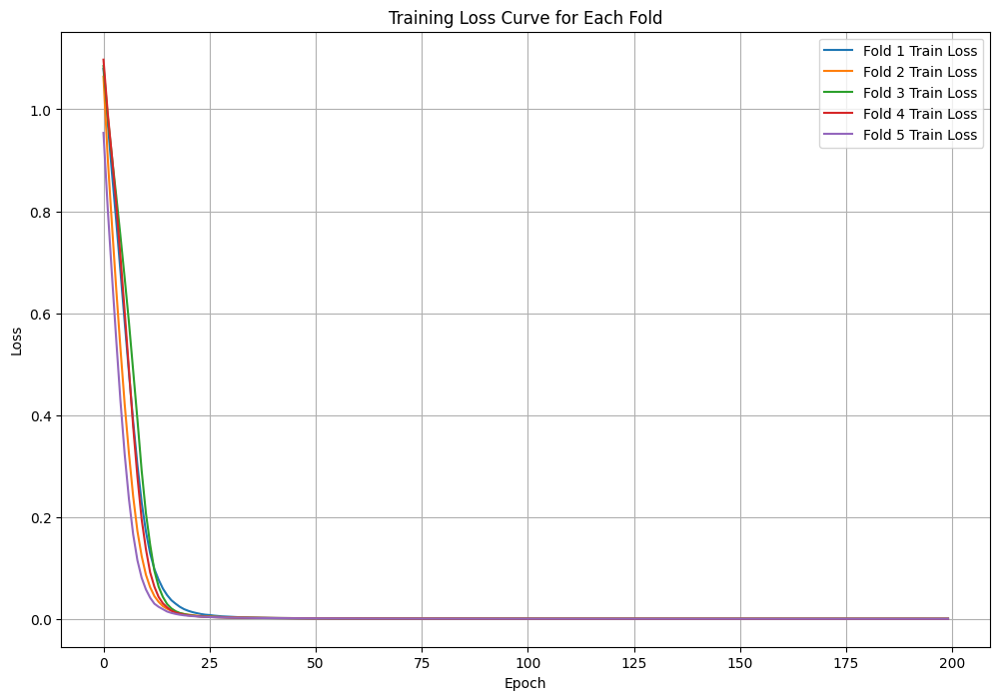

In [39]:
# Plot training loss curve for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories_large):
    plt.plot(history.history['loss'], label=f'Fold {fold+1} Train Loss')

plt.title('Training Loss Curve for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

Plot validation loss curve.

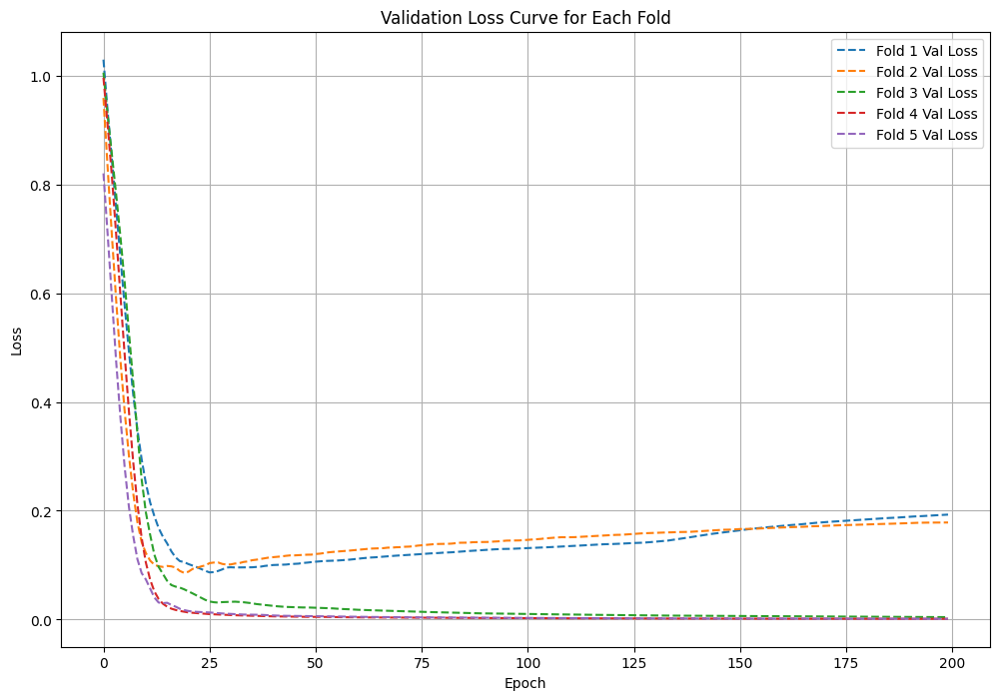

In [40]:
# Plot validation loss curve for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories_large):
    plt.plot(history.history['val_loss'], label=f'Fold {fold+1} Val Loss', linestyle='--')

plt.title('Validation Loss Curve for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

We observe from the training and validation loss curves plots that:
- Folds 1 and 2 show signs of overfitting as the validation loss starts to increase at some point, while the training loss continues to decrease
- We need to mitigate this overfitting using one of the three methods: *Regularization*, *Dropout* or *Early Stopping*


#### Plot training and validation accuracy curves

Plot train accuracy curves.

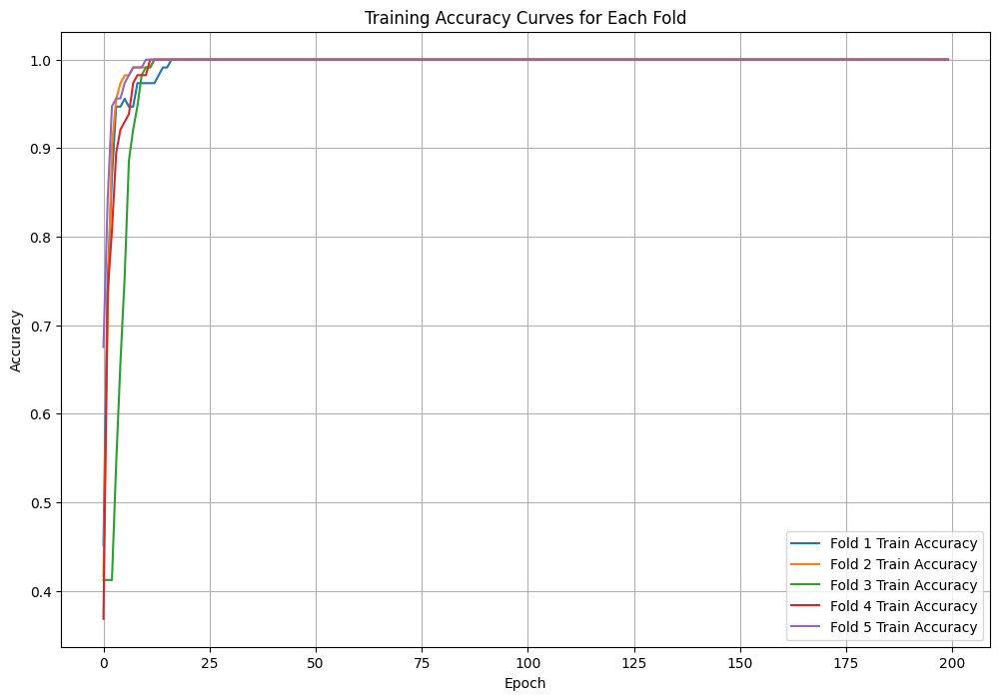

In [41]:
# Plot training accuracy curves for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories_large):
    plt.plot(history.history['accuracy'], label=f'Fold {fold+1} Train Accuracy')

plt.title('Training Accuracy Curves for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

Plot validation accuracy curves.

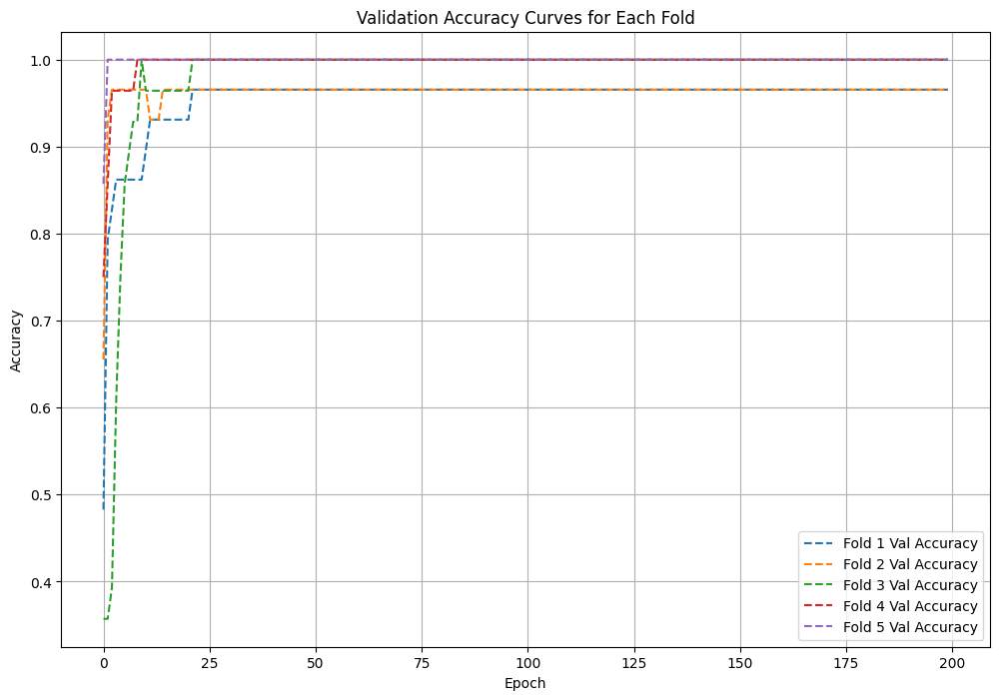

In [42]:
# Plot validation accuracy curves for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories_large):
    plt.plot(history.history['val_accuracy'], label=f'Fold {fold+1} Val Accuracy', linestyle='--')

plt.title('Validation Accuracy Curves for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

## **5. Experiment: Regularization**  
   - Add **L2 regularization** (weight decay).  
   - Add **Dropout** to hidden layers.  
   - Compare results with the baseline using cross-validation scores.  

### Regularization

Using L2 Regularization (Ridge).

Instantiate a larger model, the same as we used before, with L2 regularization.

In [43]:
def build_larger_model_l2(l2_lambda):
  model_l2 = Sequential([
      Input(shape=(X_train.shape[1],)),
      Dense(32, activation='relu', kernel_regularizer=l2(l2_lambda)), # Add L2 regularization
      Dense(64, activation='relu', kernel_regularizer=l2(l2_lambda)), # Add L2 regularization
      Dense(64, activation='relu', kernel_regularizer=l2(l2_lambda)), # Add L2 regularization
      Dense(32, activation='relu', kernel_regularizer=l2(l2_lambda)), # Add L2 regularization
      Dense(len(np.unique(y)), activation='softmax')
  ])
  return model_l2

Use K-Fold Cross-Validation with 5 folds.

In [44]:
from tensorflow.keras.regularizers import l2

# Define the number of folds
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# Define training parameters
num_epochs = 200
learning_rate = 0.001
l2_lambda = 0.001 # Define the regularization strength

# Lists to store training history for each fold
fold_histories_l2 = []
fold_val_losses_l2 = [] # To store final validation loss for each fold
fold_val_accuracies_l2 = [] # To store final validation accuracy for each fold

# Iterate over the folds
for fold, (train_index, val_index) in enumerate(kf.split(X_train)):
    print(f"--- Fold {fold+1}/{n_splits} ---")

    # Split the training data into training and validation sets for the current fold
    X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
    y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

    # One-hot encode labels for Keras
    y_train_fold_cat = to_categorical(y_train_fold)
    y_val_fold_cat = to_categorical(y_val_fold)

    # Instantiate a larger model with L2 regularization
    model_l2 = build_larger_model_l2(l2_lambda)

    # Compile model
    model_l2.compile(optimizer=Adam(learning_rate=learning_rate),
                     loss='categorical_crossentropy',
                     metrics=['accuracy'])

    # Train model
    history_l2 = model_l2.fit(X_train_fold, y_train_fold_cat,
                              validation_data=(X_val_fold, y_val_fold_cat),
                              epochs=num_epochs,
                              verbose=0)

    # Store history for this fold
    fold_histories_l2.append(history_l2)
    fold_val_losses_l2.append(history_l2.history['val_loss'][-1])
    fold_val_accuracies_l2.append(history_l2.history['val_accuracy'][-1])

    # Print evaluation for the current fold on its validation set
    loss, accuracy = model_l2.evaluate(X_val_fold, y_val_fold_cat, verbose=0)
    print(f"Fold {fold+1} Evaluation: Loss = {loss:.4f}, Accuracy = {accuracy:.4f}")

--- Fold 1/5 ---
Fold 1 Evaluation: Loss = 0.1053, Accuracy = 0.9655
--- Fold 2/5 ---
Fold 2 Evaluation: Loss = 0.1354, Accuracy = 0.9655
--- Fold 3/5 ---
Fold 3 Evaluation: Loss = 0.0423, Accuracy = 1.0000
--- Fold 4/5 ---
Fold 4 Evaluation: Loss = 0.0431, Accuracy = 1.0000
--- Fold 5/5 ---
Fold 5 Evaluation: Loss = 0.0458, Accuracy = 1.0000


Calculate and print average validation loss and accuracy across all folds.

In [45]:
average_validation_loss_l2 = np.mean(fold_val_losses_l2)
average_validation_accuracy_l2 = np.mean(fold_val_accuracies_l2)
print(f"\nAverage Validation Loss across folds: {average_validation_loss_l2:.4f}")
print(f"Average Validation Accuracy across folds: {average_validation_accuracy_l2:.4f}")


Average Validation Loss across folds: 0.0744
Average Validation Accuracy across folds: 0.9862


#### Plot training and validation loss curves.

Plot training loss curve.

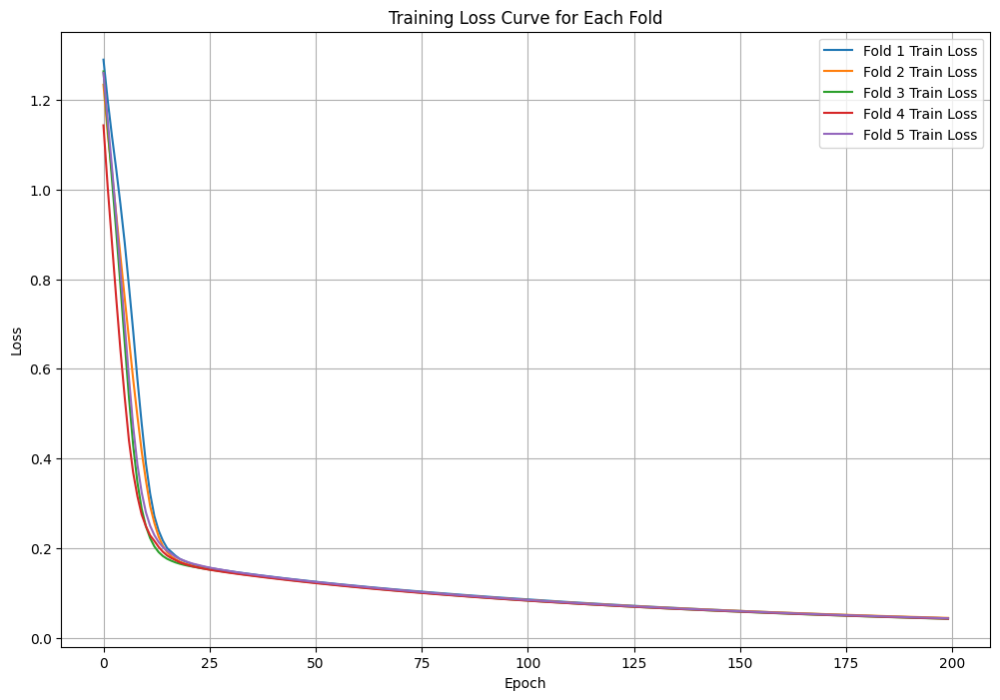

In [46]:
# Plot training loss curve for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories_l2):
    plt.plot(history.history['loss'], label=f'Fold {fold+1} Train Loss')

plt.title('Training Loss Curve for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

Plot validation loss curve.

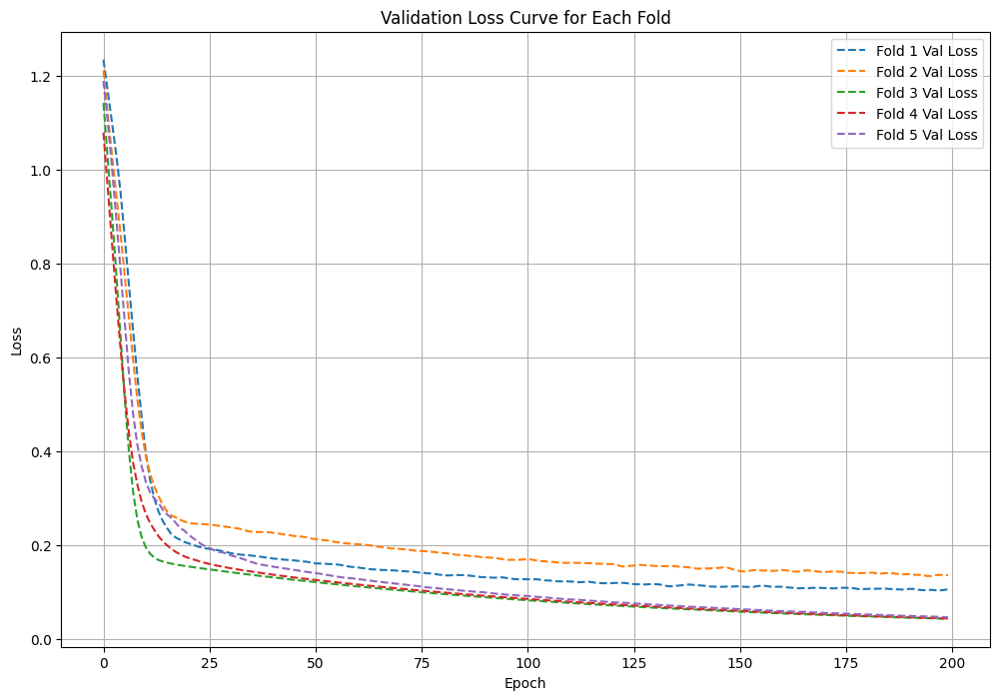

In [47]:
# Plot validation loss curve for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories_l2):
    plt.plot(history.history['val_loss'], label=f'Fold {fold+1} Val Loss', linestyle='--')

plt.title('Validation Loss Curve for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

We observe from the training and validation loss curves plots that:
- Folds 1 and 2 now continue to decrease, even if the decrease is not happening at the same rate for the validation loss as it is happening for the training loss, so the overfitting was mitigated using L2 Regularization


#### Plot training and validation accuracy curves

Plot train accuracy curves.

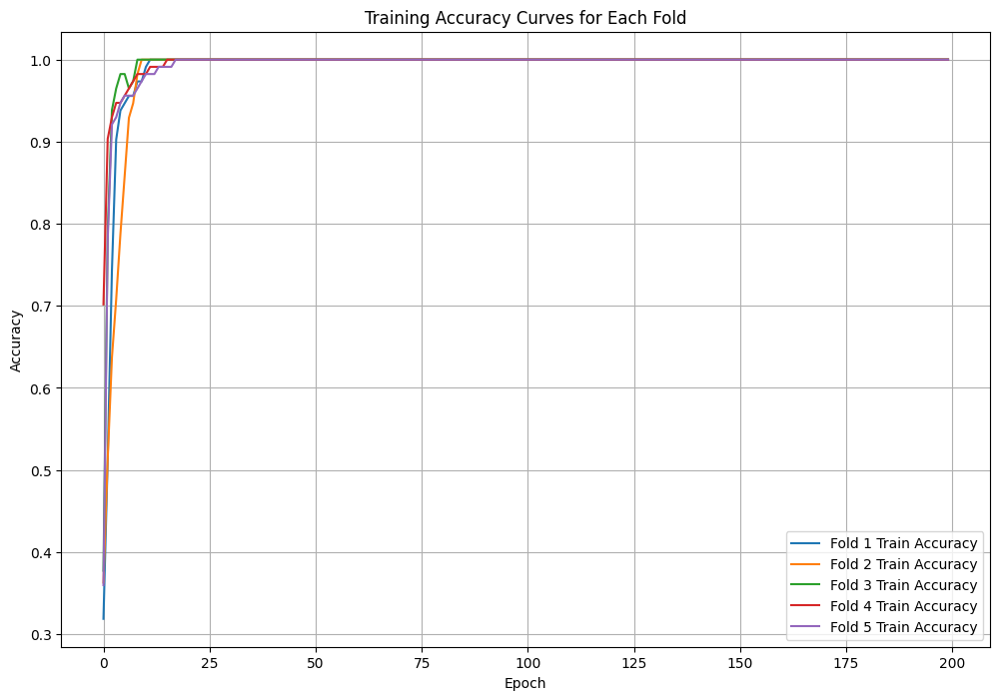

In [48]:
# Plot training accuracy curves for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories_l2):
    plt.plot(history.history['accuracy'], label=f'Fold {fold+1} Train Accuracy')

plt.title('Training Accuracy Curves for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

Plot validation accuracy curves.

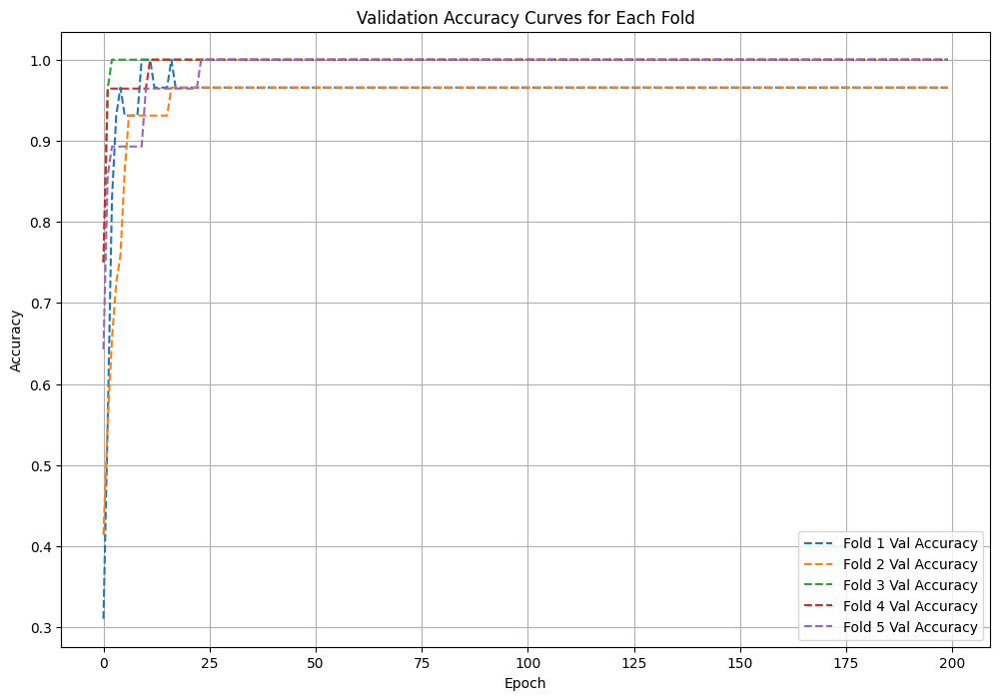

In [49]:
# Plot validation accuracy curves for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories_l2):
    plt.plot(history.history['val_accuracy'], label=f'Fold {fold+1} Val Accuracy', linestyle='--')

plt.title('Validation Accuracy Curves for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

### Dropout

Instantiate a larger model with Dropout.

In [50]:
from tensorflow.keras.layers import Dropout

def build_larger_model_dropout(dropout_rate):
    model_dropout = Sequential([
        Input(shape=(X_train.shape[1],)),
        Dense(32, activation='relu'),
        Dropout(dropout_rate), # Add Dropout layer
        Dense(64, activation='relu'),
        Dropout(dropout_rate), # Add Dropout layer
        Dense(64, activation='relu'),
        Dropout(dropout_rate), # Add Dropout layer
        Dense(32, activation='relu'),
        Dropout(dropout_rate), # Add Dropout layer
        Dense(len(np.unique(y)), activation='softmax')
    ])
    return model_dropout

Use K-Fold Cross-Validation with 5 folds and a dropout rate of 0.3.

In [51]:
# Define the number of folds
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# Define training parameters
num_epochs = 200
learning_rate = 0.001
dropout_rate = 0.2 # Define the dropout rate 1/3 of the neurons in a hidden layer

# Lists to store training history for each fold
fold_histories_dropout = []
fold_val_losses_dropout = [] # To store final validation loss for each fold
fold_val_accuracies_dropout = [] # To store final validation accuracy for each fold

# Iterate over the folds
for fold, (train_index, val_index) in enumerate(kf.split(X_train)):
    print(f"--- Fold {fold+1}/{n_splits} ---")

    # Split the training data into training and validation sets for the current fold
    X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
    y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

    # One-hot encode labels for Keras
    y_train_fold_cat = to_categorical(y_train_fold)
    y_val_fold_cat = to_categorical(y_val_fold)

    # Instantiate a larger model with Dropout
    model_dropout = build_larger_model_dropout(dropout_rate)

    # Compile model
    model_dropout.compile(optimizer=Adam(learning_rate=learning_rate),
                          loss='categorical_crossentropy',
                          metrics=['accuracy'])

    # Train model
    history_dropout = model_dropout.fit(X_train_fold, y_train_fold_cat,
                                        validation_data=(X_val_fold, y_val_fold_cat),
                                        epochs=num_epochs,
                                        verbose=0)

    # Store history for this fold
    fold_histories_dropout.append(history_dropout)
    fold_val_losses_dropout.append(history_dropout.history['val_loss'][-1])
    fold_val_accuracies_dropout.append(history_dropout.history['val_accuracy'][-1])

    # Print evaluation for the current fold on its validation set
    loss, accuracy = model_dropout.evaluate(X_val_fold, y_val_fold_cat, verbose=0)
    print(f"Fold {fold+1} Evaluation: Loss = {loss:.4f}, Accuracy = {accuracy:.4f}")


--- Fold 1/5 ---
Fold 1 Evaluation: Loss = 0.0724, Accuracy = 0.9655
--- Fold 2/5 ---
Fold 2 Evaluation: Loss = 0.2299, Accuracy = 0.9655
--- Fold 3/5 ---
Fold 3 Evaluation: Loss = 0.0000, Accuracy = 1.0000
--- Fold 4/5 ---
Fold 4 Evaluation: Loss = 0.0000, Accuracy = 1.0000
--- Fold 5/5 ---
Fold 5 Evaluation: Loss = 0.0001, Accuracy = 1.0000


Calculate and print average validation loss and accuracy across all folds.

In [52]:
average_validation_loss_dropout = np.mean(fold_val_losses_dropout)
average_validation_accuracy_dropout = np.mean(fold_val_accuracies_dropout)
print(f"\nAverage Validation Loss across folds: {average_validation_loss_dropout:.4f}")
print(f"Average Validation Accuracy across folds: {average_validation_accuracy_dropout:.4f}")


Average Validation Loss across folds: 0.0605
Average Validation Accuracy across folds: 0.9862


#### Plot training and validation loss curves.

Plot training loss curve.

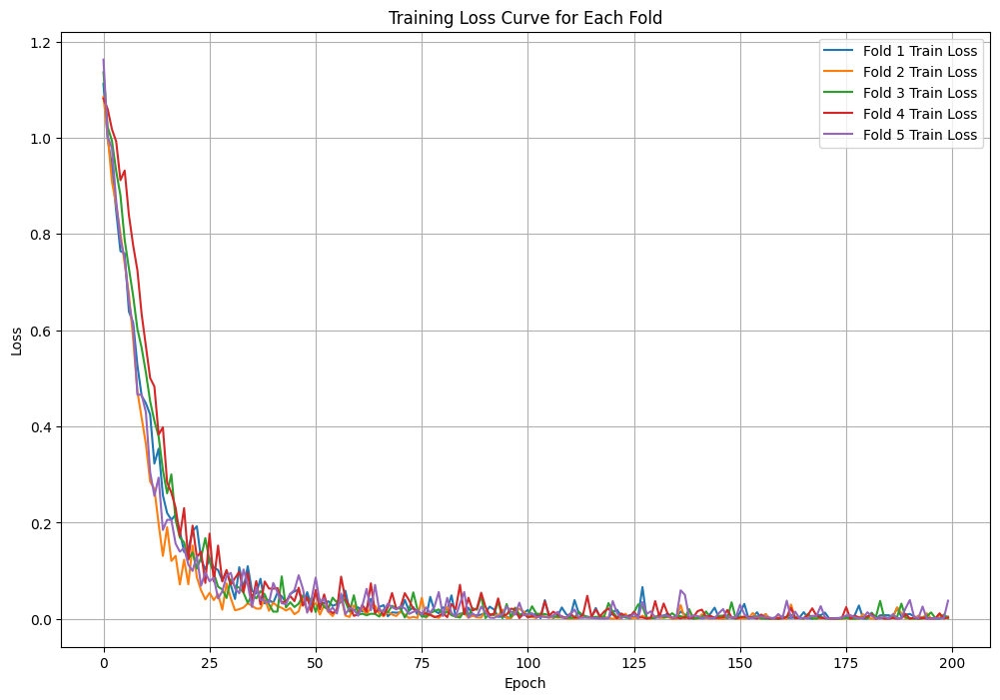

In [53]:
# Plot training loss curve for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories_dropout):
    plt.plot(history.history['loss'], label=f'Fold {fold+1} Train Loss')

plt.title('Training Loss Curve for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

Plot validation loss curve.

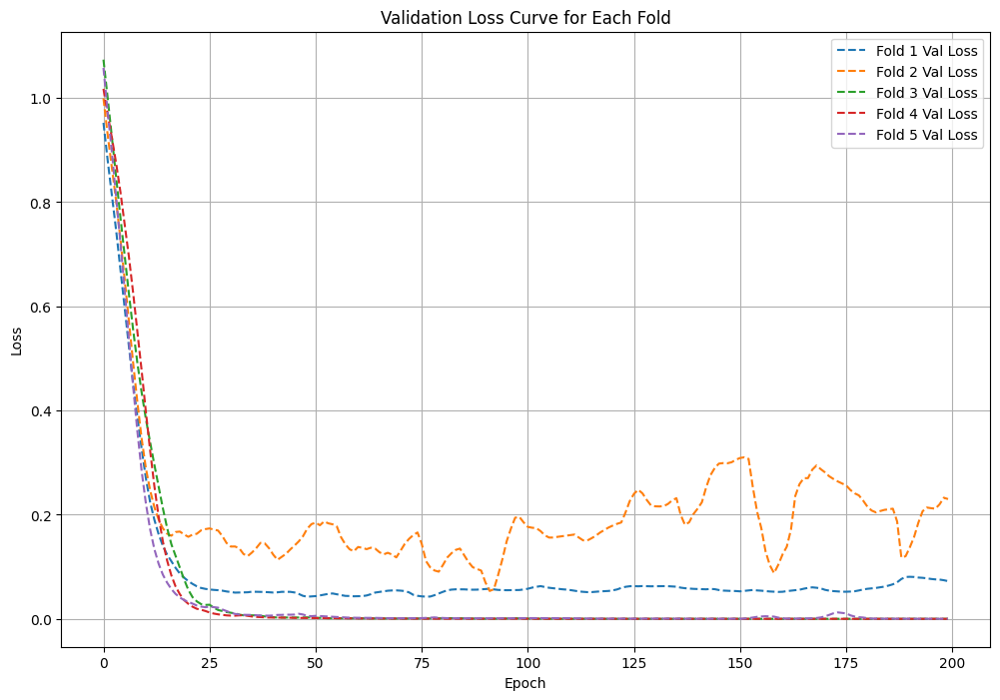

In [54]:
# Plot validation loss curve for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories_dropout):
    plt.plot(history.history['val_loss'], label=f'Fold {fold+1} Val Loss', linestyle='--')

plt.title('Validation Loss Curve for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

We observe from the training and validation loss curves plots that:
- Folds 1 and 2 have a chaotic increase and decrease for the validation loss curve and we can't predict if at the end of these epochs the loss will increase or dicrease
- For the training loss, all folds have a heart-rate like increase-decrease, but ultimately the training loss curve is decreasing


#### Plot training and validation accuracy curves

Plot train accuracy curves.

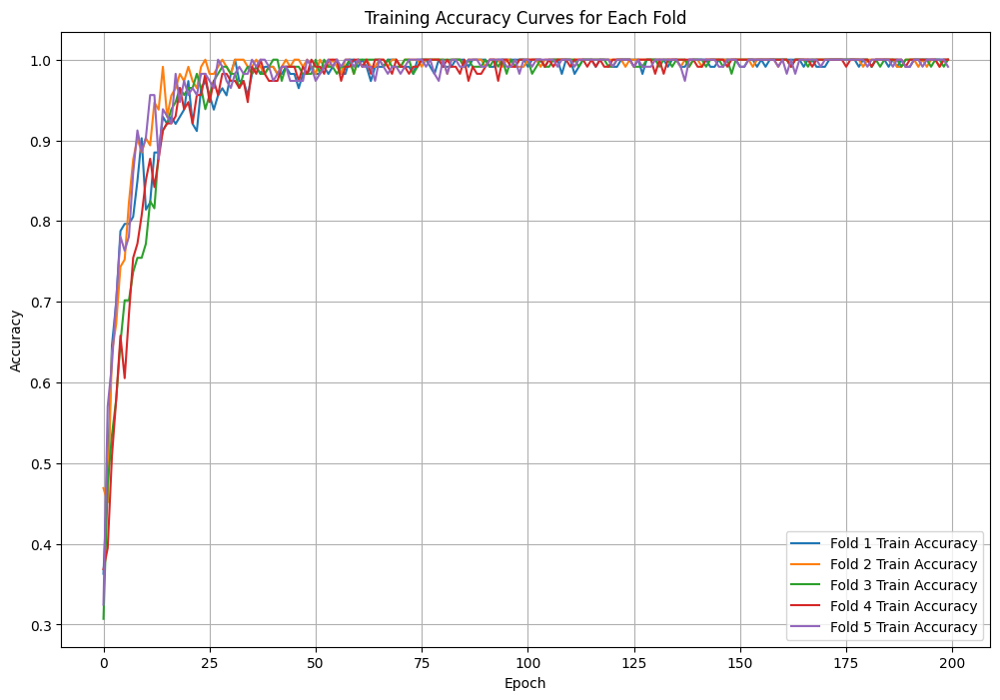

In [55]:
# Plot training accuracy curves for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories_dropout):
    plt.plot(history.history['accuracy'], label=f'Fold {fold+1} Train Accuracy')

plt.title('Training Accuracy Curves for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

Plot validation accuracy curves.

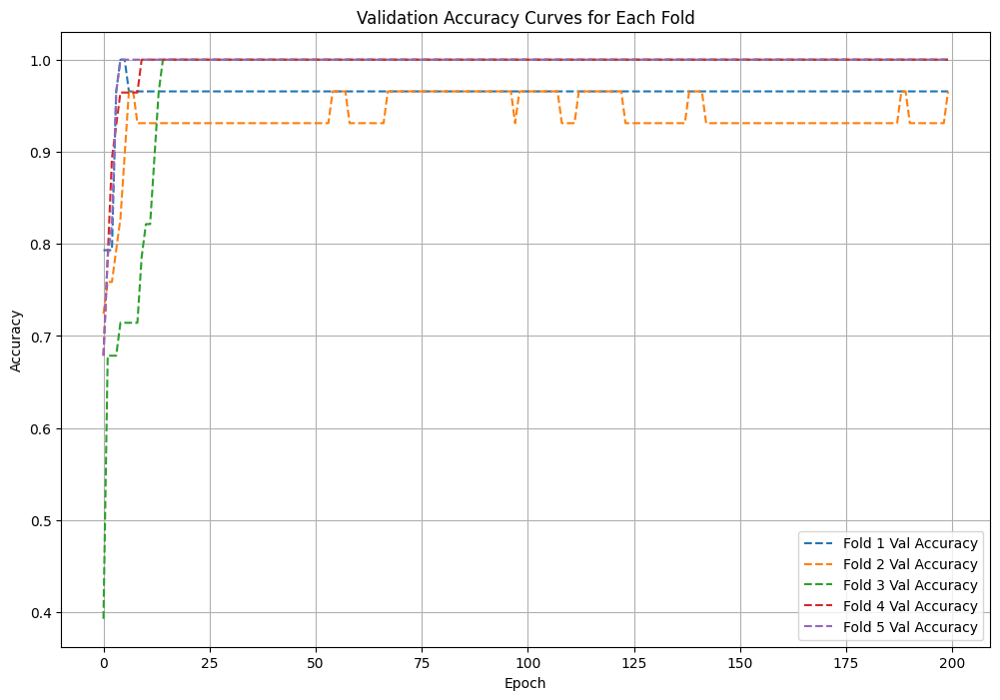

In [56]:
# Plot validation accuracy curves for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories_dropout):
    plt.plot(history.history['val_accuracy'], label=f'Fold {fold+1} Val Accuracy', linestyle='--')

plt.title('Validation Accuracy Curves for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

### Early Stopping

Instantiate a large model.

In [57]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input

def build_larger_model():
  model_large = Sequential([
      Input(shape=(X_train.shape[1],)),
      Dense(32, activation='relu'),
      Dense(64, activation='relu'),
      Dense(64, activation='relu'),
      Dense(32, activation='relu'),
      Dense(len(np.unique(y)), activation='softmax')
  ])
  return model_large

Use K-Fold Cross-Validation with 5 folds.

In [58]:
from tensorflow.keras.callbacks import EarlyStopping

# Define the number of folds
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# Define training parameters
num_epochs = 200
learning_rate = 0.001

# Define Early Stopping callback
early_stopping = EarlyStopping(monitor='val_loss', # Monitor validation loss
                               patience=10,       # Number of epochs with no improvement after which training will be stopped
                               restore_best_weights=True) # Restore model weights from the epoch with the best value of the monitored quantity.

# Lists to store training history for each fold
fold_histories_early_stopping = []
fold_val_losses_large_early = [] # To store final validation loss for each fold
fold_val_accuracies_large_early = [] # To store final validation accuracy for each fold

# Iterate over the folds
for fold, (train_index, val_index) in enumerate(kf.split(X_train)):
    print(f"--- Fold {fold+1}/{n_splits} ---")

    # Split the training data into training and validation sets for the current fold
    X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
    y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

    # One-hot encode labels for Keras
    y_train_fold_cat = to_categorical(y_train_fold)
    y_val_fold_cat = to_categorical(y_val_fold)

    # Instantiate a larger model for this fold
    model_early_stopping = build_larger_model()

    # Compile model
    model_early_stopping.compile(optimizer=Adam(learning_rate=learning_rate),
                                 loss='categorical_crossentropy',
                                 metrics=['accuracy'])

    # Train model with Early Stopping
    history_early_stopping = model_early_stopping.fit(X_train_fold, y_train_fold_cat,
                                                      validation_data=(X_val_fold, y_val_fold_cat),
                                                      epochs=num_epochs,
                                                      callbacks=[early_stopping], # Add Early Stopping callback
                                                      verbose=0)

    # Store history for this fold
    fold_histories_early_stopping.append(history_early_stopping)
    fold_val_losses_large_early.append(history_early_stopping.history['val_loss'][-1])
    fold_val_accuracies_large_early.append(history_early_stopping.history['val_accuracy'][-1])

    # Print evaluation for the current fold on its validation set
    loss, accuracy = model_early_stopping.evaluate(X_val_fold, y_val_fold_cat, verbose=0)
    print(f"Fold {fold+1} Evaluation: Loss = {loss:.4f}, Accuracy = {accuracy:.4f}")

--- Fold 1/5 ---
Fold 1 Evaluation: Loss = 0.0102, Accuracy = 1.0000
--- Fold 2/5 ---
Fold 2 Evaluation: Loss = 0.1928, Accuracy = 0.9655
--- Fold 3/5 ---
Fold 3 Evaluation: Loss = 0.0010, Accuracy = 1.0000
--- Fold 4/5 ---
Fold 4 Evaluation: Loss = 0.0047, Accuracy = 1.0000
--- Fold 5/5 ---
Fold 5 Evaluation: Loss = 0.0004, Accuracy = 1.0000


Calculate and print average validation loss and accuracy across all folds.

In [59]:
average_validation_loss_early = np.mean(fold_val_losses_large_early)
average_validation_accuracy_early = np.mean(fold_val_accuracies_large_early)
print(f"\nAverage Validation Loss across folds: {average_validation_loss_early:.4f}")
print(f"Average Validation Accuracy across folds: {average_validation_accuracy_early:.4f}")


Average Validation Loss across folds: 0.0442
Average Validation Accuracy across folds: 0.9931


#### Plot training and validation loss curves.

Plot training loss curve.

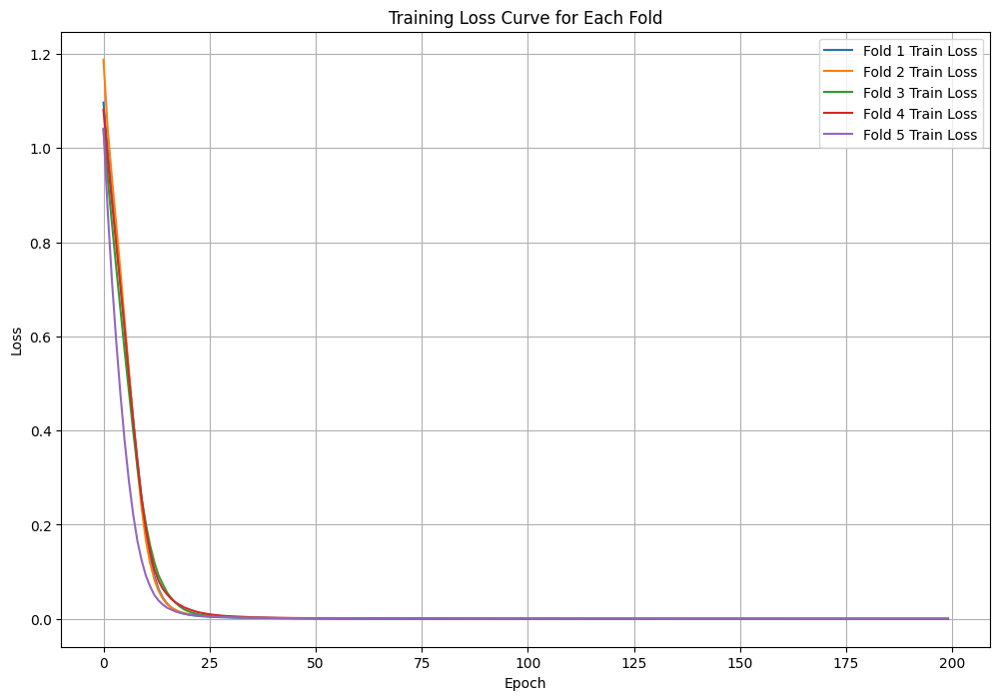

In [60]:
# Plot training loss curve for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories_early_stopping):
    plt.plot(history.history['loss'], label=f'Fold {fold+1} Train Loss')

plt.title('Training Loss Curve for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

Plot validation loss curve.

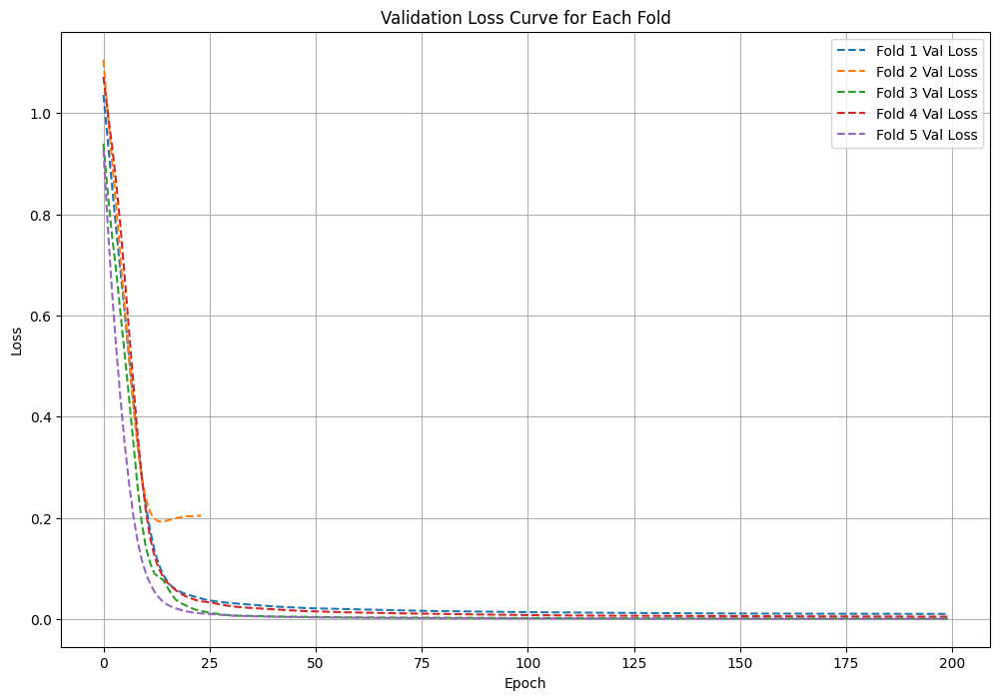

In [61]:
# Plot validation loss curve for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories_early_stopping):
    plt.plot(history.history['val_loss'], label=f'Fold {fold+1} Val Loss', linestyle='--')

plt.title('Validation Loss Curve for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

We observe from the training and validation loss curves plots that:
- Folds 1 and 2 which previously had an increasing validation loss curve, now stop when the curves start to increase, so Early Stopping has mitigated overfitting successfully.

#### Plot training and validation accuracy curves

Plot train accuracy curves.

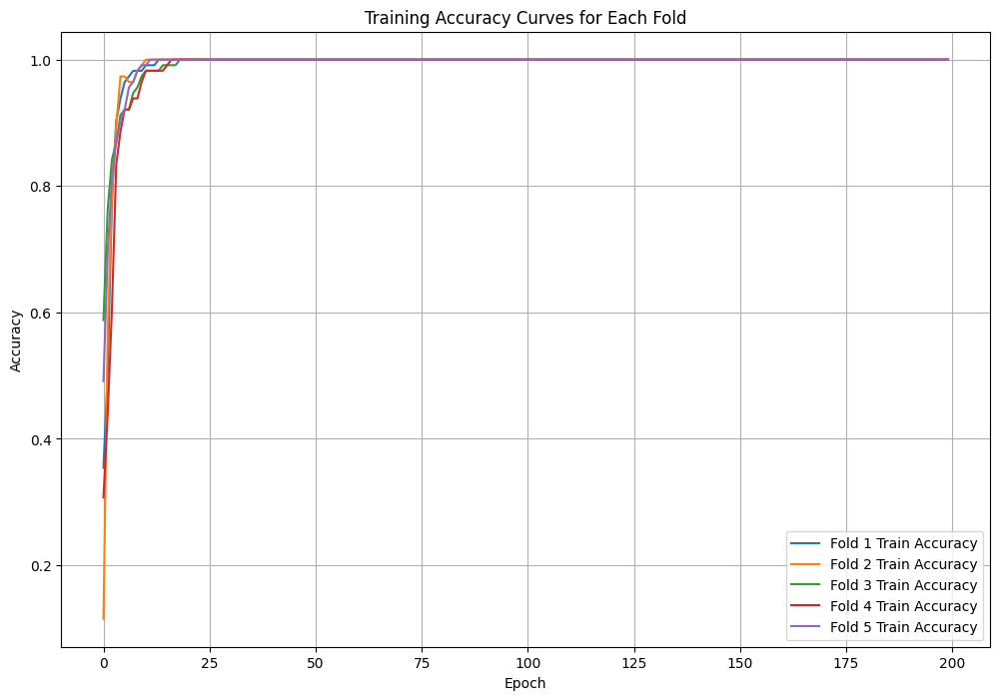

In [62]:
# Plot training accuracy curves for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories_early_stopping):
    plt.plot(history.history['accuracy'], label=f'Fold {fold+1} Train Accuracy')

plt.title('Training Accuracy Curves for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

Plot validation accuracy curves.

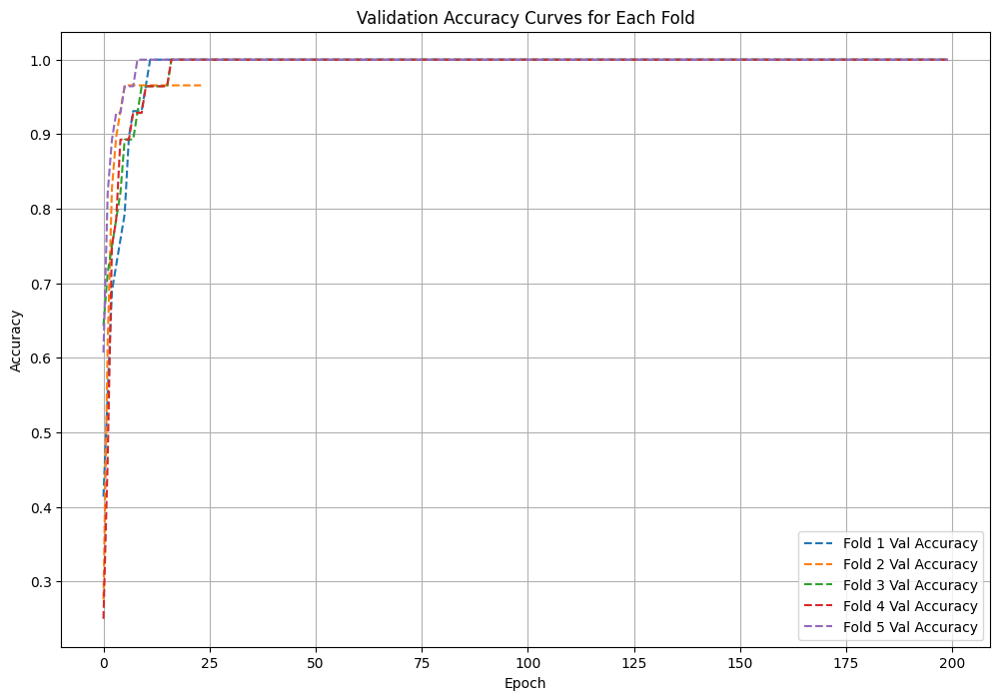

In [63]:
# Plot validation accuracy curves for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories_early_stopping):
    plt.plot(history.history['val_accuracy'], label=f'Fold {fold+1} Val Accuracy', linestyle='--')

plt.title('Validation Accuracy Curves for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

### Comparison to baseline model

Compare results with the baseline using cross-validation scores.

In [64]:
import pandas as pd

# Create a dictionary to store the average results
comparison_data = {
    'Model': ['Baseline (Adam)', 'Baseline (SGD)', 'Large Model (Overfitted)', 'Large Model (L2 Reg)', 'Large Model (Dropout)', 'Large Model (Early Stopping)'],
    'Average Validation Loss': [average_validation_loss, average_validation_loss_sgd, average_validation_loss_large, average_validation_loss_l2, average_validation_loss_dropout, average_validation_loss_early],
    'Average Validation Accuracy': [average_validation_accuracy, average_validation_accuracy_sgd, average_validation_accuracy_large, average_validation_accuracy_l2, average_validation_accuracy_dropout, average_validation_accuracy_early]
}

# Create a pandas DataFrame
comparison_df = pd.DataFrame(comparison_data)

# Display the comparison table
display(comparison_df)

,Model,Average Validation Loss,Average Validation Accuracy
0,Baseline (Adam),0.030708,0.986207
1,Baseline (SGD),0.050630,0.979310
2,Large Model (Overfitted),0.075692,0.986207
3,Large Model (L2 Reg),0.074381,0.986207
4,Large Model (Dropout),0.060478,0.986207
5,Large Model (Early Stopping),0.044204,0.993103


Based on the cross-validation results presented in the table above, we can draw the following conclusions:

- **Baseline Models (Adam and SGD):** Both baseline models achieved very high average validation accuracies and relatively low average validation losses. This suggests that even a simple architecture is quite effective for this dataset, but the best and most reliable baseline model is the one that uses **Adam**.

- **Large Model (Overfitted):** The larger model without any regularization or early stopping showed signs of overfitting, as observed in the validation loss plots where the loss started to increase after a certain number of epochs.

- **Large Model with L2 Regularization:** Adding L2 regularization to the large model resulted with a high average validation accuracy and a very low average validation loss.

- **Large Model with Dropout:** The large model with Dropout achieved an average validation accuracy similar to the baseline modelsand a higher average validation losscompared to the L2 regularized and Early Stopping models. Looking at the validation loss plots for the Dropout model, the fold curves indicate that the model was not fully stabilized within the given epochs.

- **Large Model with Early Stopping:** Implementing Early Stopping on the large model resulted in the lowest average validation loss and an average validation accuracy similar to the baseline models. Early Stopping effectively prevented the model from training for too long and overfitting, as seen in the truncated training in the validation loss plots for some folds.


## **6. Report results**  
   - Report the corresponding metrics for the task you selected:  
   - Use **cross-validation** results to justify your conclusions (not just a single split).  
   - Explain what you observed about underfitting/overfitting.  


### Conclusions based on cross-validation results


In [65]:
# Add the classification report for the final Adam model on the test set
print("Classification Report for Final Baseline Model (Adam) on Test Set:")
print(classification_report(y_test, y_pred_test, target_names=target_names))

print("\n" + "="*50 + "\n") # Separator

# Add the classification report for the final SGD model on the test set
print("Classification Report for Final Baseline Model (SGD) on Test Set:")
y_pred_prob_test_sgd_final = final_model_sgd.predict(X_test, verbose=0)
y_pred_test_sgd_final = np.argmax(y_pred_prob_test_sgd_final, axis=1)
print(classification_report(y_test, y_pred_test_sgd_final, target_names=target_names))

Classification Report for Final Baseline Model (Adam) on Test Set:
              precision    recall  f1-score   support

     class_0       1.00      1.00      1.00        12
     class_1       0.93      1.00      0.97        14
     class_2       1.00      0.90      0.95        10

    accuracy                           0.97        36
   macro avg       0.98      0.97      0.97        36
weighted avg       0.97      0.97      0.97        36



Classification Report for Final Baseline Model (SGD) on Test Set:
              precision    recall  f1-score   support

     class_0       0.92      1.00      0.96        12
     class_1       0.93      0.93      0.93        14
     class_2       1.00      0.90      0.95        10

    accuracy                           0.94        36
   macro avg       0.95      0.94      0.95        36
weighted avg       0.95      0.94      0.94        36



We can observe from these metrics that the 2 baseline models perform very well on the unseen data in the test set.
- The **Adam** optimizer model is the most reliable out of the two, as it is consistent and it always predicts *class_0* perfectly, while only 1 misclassiffication occurs between the classes *class_1* and *class_2*. This can also be seen from the metrics in the classification report for the Final Baseline Model Adam.
- The **SGD** optimizer model has also a very good performance on the test set, but is less reliable than the Adam model. The metrics in the classification report vary, as does the model's performance. This happens because SGD works in random mini-batches of data, which can lead to different results that are more visible in a smaller dataset, like is this wine dataset.

### Observations about underfitting / overfitting

From the training and validation loss/accuracy plots generated during the experiments, we observed the following regarding underfitting and overfitting:

- **Underfitting:** We did not observe significant signs of underfitting in any of the models. Both the baseline and the larger models were able to achieve high training accuracies and low training losses, indicating that they had sufficient capacity to learn the training data.

- **Overfitting:** Overfitting was most evident in the **Large Model (Overfitted)** where the validation loss curves for some folds started to diverge from the training loss curves and increase after an initial period of decrease. This indicated that the model was learning the training data too well and losing its ability to generalize to unseen data (the validation set). The training accuracy continued to increase, while the validation accuracy plateaued or slightly decreased for these overfitted folds.

- **Mitigation of Overfitting:** For this we used the *L2 Regularization*, *Dropout* and *Early Stopping*, as explained in detail above.



### Final Conclusion


**Overall:**
- For this dataset, the simple baseline models perform remarkably well, with the model trained with the **Adam** optimizer being the most reliable.
- Among the larger models, **Early Stopping** achieved the lowest average validation loss and the highest validation accuracy, indicating that it is the best mitigating method of overfitting.
- **L2 Regularization** resulted in the high average validation accuracy and a low validation loss, but not better than Early Stopping.
- **Dropout**, while generally effective, did not show the same level of improvement as L2 regularization or Early Stopping for this dataset.

# Regression: Energy Efficiency Dataset

## **1. Data Preparation**
   - Load the dataset.  
   - Split into train/validation/test sets.  
   - Standardize features.  
   - Use **k-fold cross-validation** (e.g., 5-fold) on the training set to evaluate models more robustly.  

### Load the dataset and visualise its structure

In [68]:
import pandas as pd

# Load the dataset from the Excel file
df = pd.read_excel('/content/ENB2012_data.xlsx')

# Display the first few rows to check the structure
display(df.head())

,X1,X2,X3,X4,X5,X6,X7,X8,Y1,Y2
0,0.98,514.5,294.0,110.25,7.0,2,0.0,0,15.55,21.33
1,0.98,514.5,294.0,110.25,7.0,3,0.0,0,15.55,21.33
2,0.98,514.5,294.0,110.25,7.0,4,0.0,0,15.55,21.33
3,0.98,514.5,294.0,110.25,7.0,5,0.0,0,15.55,21.33
4,0.90,563.5,318.5,122.50,7.0,2,0.0,0,20.84,28.28


- We observe that all features of the dataset are numeric columns

**Energy Efficiency Dataset - Column Descriptions:**

- **X1:** Relative Compactness
- **X2:** Surface Area
- **X3:** Wall Area
- **X4:** Roof Area
- **X5:** Overall Height
- **X6:** Orientation (2: North, 3: East, 4: South, 5: West)
- **X7:** Glazing Area
- **X8:** Glazing Area Distribution (0: Uniform, 1: North, 2: East, 3: South, 4: West, 5: All orientations)
- **Y1:** Heating Load (Output)
- **Y2:** Cooling Load (Output)

### Check for null values

In [69]:
# Check for missing values
print("Missing values per column:")
print(df.isnull().sum())

Missing values per column:
X1    0
X2    0
X3    0
X4    0
X5    0
X6    0
X7    0
X8    0
Y1    0
Y2    0
dtype: int64


- There are no missing values in the dataset

### Visualise feature distribution

Pair plot features with targets (Y1 and Y2) as hue.

In [70]:
import seaborn as sns
import matplotlib.pyplot as plt

# Separate features and targets for plotting
X_features = df.drop(['Y1', 'Y2'], axis=1)
y_targets = df[['Y1', 'Y2']]

Pairplot with Y1 as hue

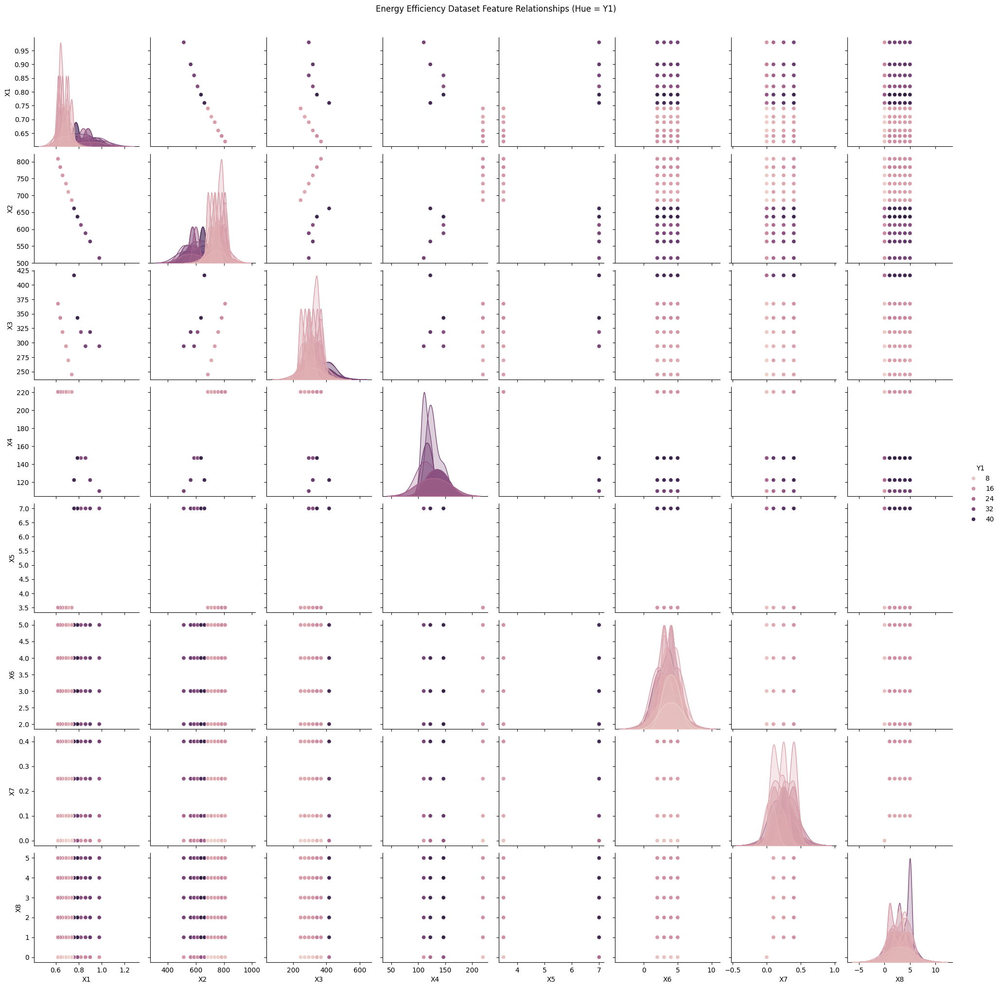

In [71]:
sns.pairplot(pd.concat([X_features, y_targets['Y1']], axis=1), hue='Y1')
plt.suptitle("Energy Efficiency Dataset Feature Relationships (Hue = Y1)", y=1.02)
plt.show()

Pairplot with Y2 as hue

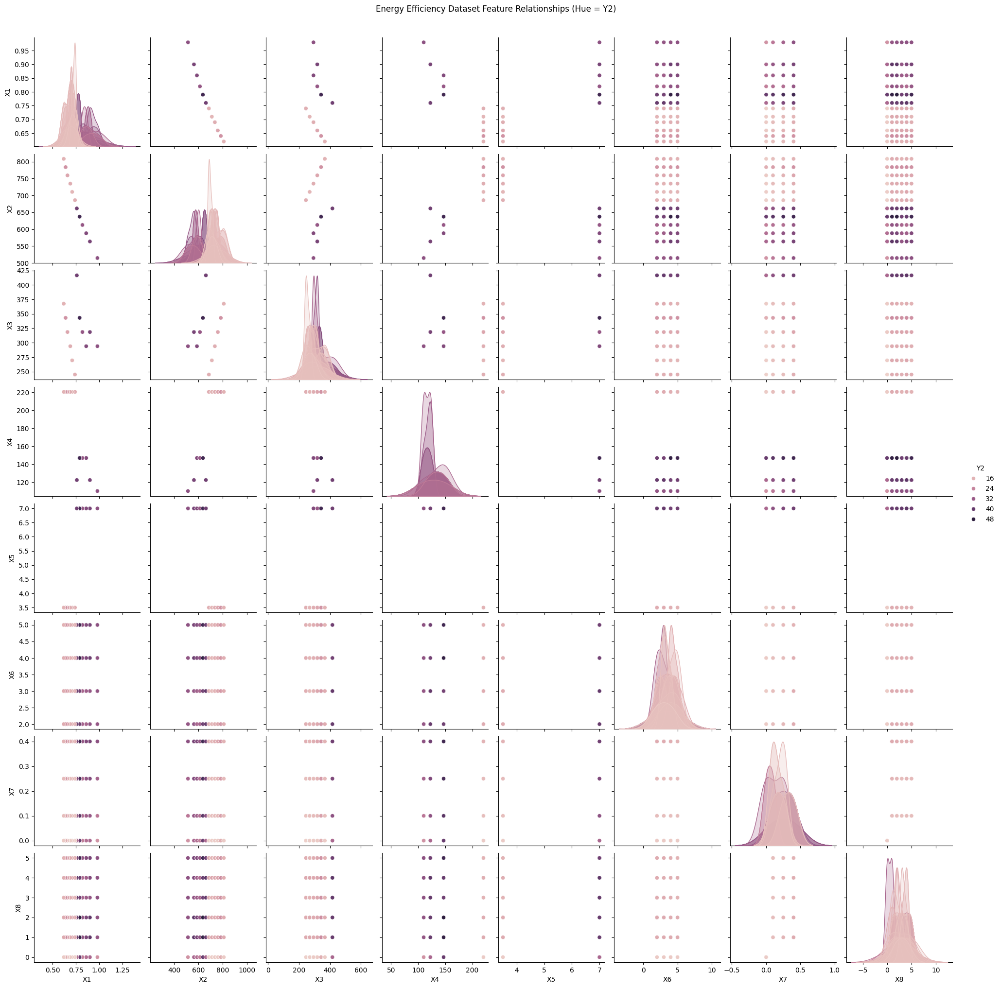

In [72]:
sns.pairplot(pd.concat([X_features, y_targets['Y2']], axis=1), hue='Y2')
plt.suptitle("Energy Efficiency Dataset Feature Relationships (Hue = Y2)", y=1.02)
plt.show()

- We can see that some features are linearly separable while others aren't, for both plots.

Plot the correlation heatmap between features and targets.

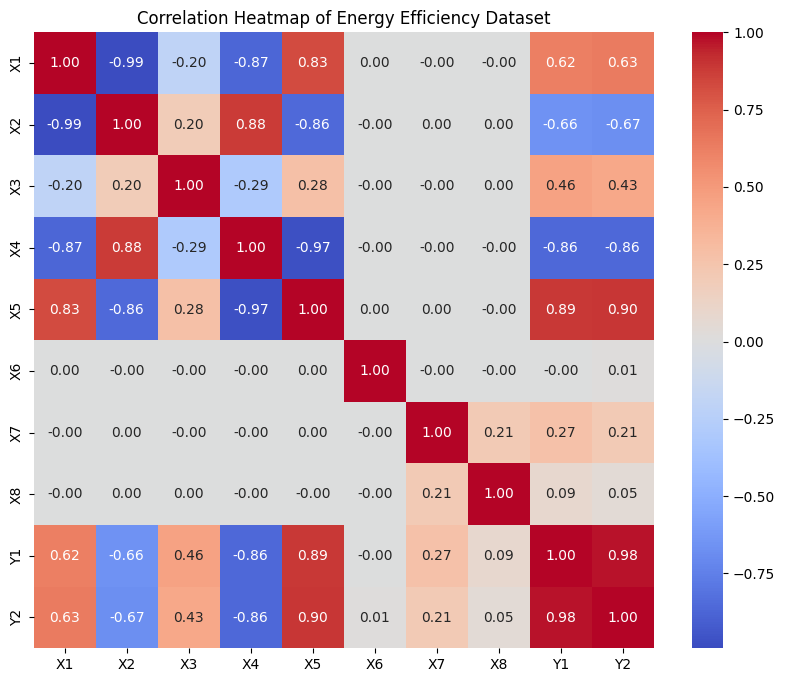

In [73]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Calculate the correlation matrix for the entire DataFrame
correlation_matrix_reg = df.corr(numeric_only=True)

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix_reg, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Energy Efficiency Dataset')
plt.show()

We can see from the heatmap that:

- Features X2 (Surface Area) and X4 (Overall Height) show strong negative correlations with both Y1 (Heating Load) and Y2 (Cooling Load).
- Features X1 (Relative Compactness), X3 (Wall Area), and X5 (Orientation) have moderate to strong positive correlations with Y1 and Y2.
- X6 (Glazing Area Distribution), X7 (Orientation), and X8 (Days of week) show weaker correlations with the target variables.
- Y1 and Y2 are very strongly positively correlated with each other.

### Check for outliers

Check for features outliers.

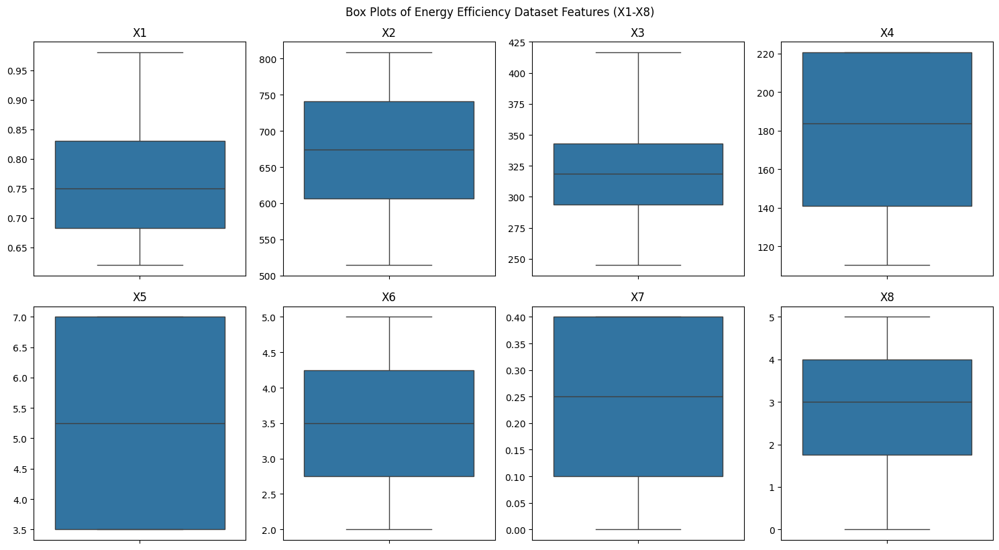

In [74]:
# Select only the numerical features for box plots, excluding targets Y1 and Y2
numerical_features_reg = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
# Remove target columns if they were included
for target in ['Y1', 'Y2']:
    if target in numerical_features_reg:
        numerical_features_reg.remove(target)

# Ensure we only plot the X features
X_features_cols = numerical_features_reg

# Determine the grid size as 2 rows and 4 columns
n_rows = 2
n_cols = 4
n_features = len(X_features_cols)

# Create subplots with the specified grid size
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 4))
axes = axes.flatten() # Flatten the 2D array of axes for easy iteration

# Create a box plot for each numerical feature
for i, col in enumerate(X_features_cols):
    if i < len(axes): # Ensure we don't go out of bounds if number of features is less than grid size
          sns.boxplot(y=df[col], ax=axes[i])
          axes[i].set_title(col)
          axes[i].set_ylabel('') # Remove y-axis label for cleaner look

# Hide any unused subplots if any
for j in range(n_features, len(axes)):
    fig.delaxes(axes[j])


plt.tight_layout()
plt.suptitle("Box Plots of Energy Efficiency Dataset Features (X1-X8)", y=1.02)
plt.show()

- We observe from the boxplots that there are no outliers.

Visualize targets Y1 and Y2 distribution.

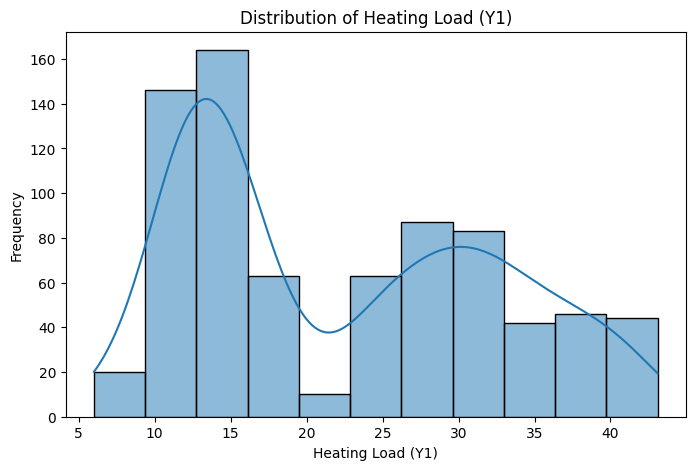

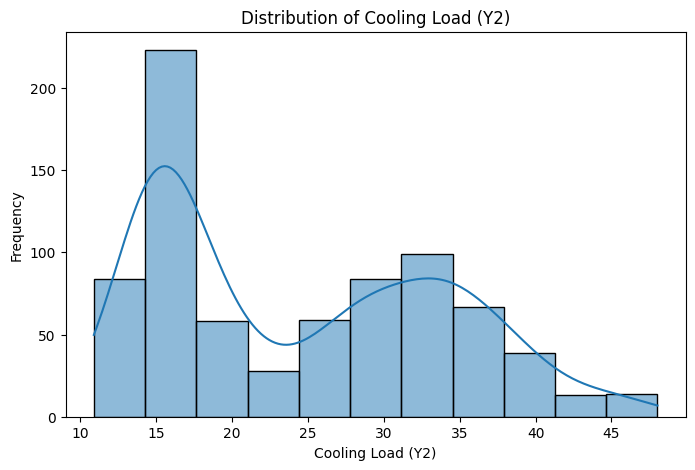

In [75]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot distribution of Y1 (Heating Load)
plt.figure(figsize=(8, 5))
sns.histplot(df['Y1'], kde=True)
plt.title('Distribution of Heating Load (Y1)')
plt.xlabel('Heating Load (Y1)')
plt.ylabel('Frequency')
plt.show()

# Plot distribution of Y2 (Cooling Load)
plt.figure(figsize=(8, 5))
sns.histplot(df['Y2'], kde=True)
plt.title('Distribution of Cooling Load (Y2)')
plt.xlabel('Cooling Load (Y2)')
plt.ylabel('Frequency')
plt.show()

- The distributions of both Y1 (Heating Load) and Y2 (Cooling Load) don't show any outliers or unusual values.
- Both targets seem to peak around the values 15.

### Drop not useful features

We will drop features *X6* and *X8* as they are very weakly correlated with both of the targets.

In [76]:
# Drop features X6 and X8 based on weak correlation
df = df.drop(['X6', 'X8'], axis=1)
print("Dropped columns 'X6' and 'X8'. New DataFrame shape:", df.shape)

Dropped columns 'X6' and 'X8'. New DataFrame shape: (768, 8)


In [77]:
df.head()

,X1,X2,X3,X4,X5,X7,Y1,Y2
0,0.98,514.5,294.0,110.25,7.0,0.0,15.55,21.33
1,0.98,514.5,294.0,110.25,7.0,0.0,15.55,21.33
2,0.98,514.5,294.0,110.25,7.0,0.0,15.55,21.33
3,0.98,514.5,294.0,110.25,7.0,0.0,15.55,21.33
4,0.90,563.5,318.5,122.50,7.0,0.0,20.84,28.28


### Split into train / validation / test sets

Split the data into training and testing sets and standardize the features and targets using `StandardScaler`.

In [78]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import numpy as np

# Separate features (X) and targets (Y)
X = df.drop(['Y1', 'Y2'], axis=1)
y = df[['Y1', 'Y2']] # Keep Y as a DataFrame or NumPy array with two columns

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) # No stratify for regression

# Standardize features
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)

# Standardize targets
scaler_Y = StandardScaler()
y_train_scaled = scaler_Y.fit_transform(y_train)
y_test_scaled = scaler_Y.transform(y_test)


print("Original X_train shape:", X_train.shape)
print("Scaled X_train shape:", X_train_scaled.shape)
print("Original Y_train shape:", y_train.shape)
print("Scaled Y_train shape:", y_train_scaled.shape)

Original X_train shape: (614, 6)
Scaled X_train shape: (614, 6)
Original Y_train shape: (614, 2)
Scaled Y_train shape: (614, 2)


### Use **k-fold cross-validation**
We will use k-fold cross-validation (e.g., 5-fold) on the training set to evaluate models more robustly.  


In [79]:
from sklearn.model_selection import KFold
import numpy as np

# Define the number of folds
n_splits = 5

# Initialize KFold
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# We will use these lists to store results for each fold
fold_results = []

# Iterate over the folds
for fold, (train_index, val_index) in enumerate(kf.split(X_train)):
    print(f"--- Fold {fold+1}/{n_splits} ---")

    # Split the training data into training and validation sets for the current fold
    X_train_fold, X_val_fold = X_train_scaled[train_index], X_train_scaled[val_index]
    y_train_fold, y_val_fold = y_train_scaled[train_index], y_train_scaled[val_index]


    print(f"Train set shape for fold {fold+1}: {X_train_fold.shape}")
    print(f"Validation set shape for fold {fold+1}: {X_val_fold.shape}")
    print(f"Train labels shape for fold {fold+1}: {y_train_fold_cat.shape}")
    print(f"Validation labels shape for fold {fold+1}: {y_val_fold_cat.shape}")

--- Fold 1/5 ---
Train set shape for fold 1: (491, 6)
Validation set shape for fold 1: (123, 6)
Train labels shape for fold 1: (114, 3)
Validation labels shape for fold 1: (28, 3)
--- Fold 2/5 ---
Train set shape for fold 2: (491, 6)
Validation set shape for fold 2: (123, 6)
Train labels shape for fold 2: (114, 3)
Validation labels shape for fold 2: (28, 3)
--- Fold 3/5 ---
Train set shape for fold 3: (491, 6)
Validation set shape for fold 3: (123, 6)
Train labels shape for fold 3: (114, 3)
Validation labels shape for fold 3: (28, 3)
--- Fold 4/5 ---
Train set shape for fold 4: (491, 6)
Validation set shape for fold 4: (123, 6)
Train labels shape for fold 4: (114, 3)
Validation labels shape for fold 4: (28, 3)
--- Fold 5/5 ---
Train set shape for fold 5: (492, 6)
Validation set shape for fold 5: (122, 6)
Train labels shape for fold 5: (114, 3)
Validation labels shape for fold 5: (28, 3)


- In the next steps, we will build, train, and evaluate the Keras model within the loop that iterates through each one of the 5 folds using `X_train_fold`, `y_train_fold` for training and `X_val_fold`, `y_val_fold` for validation.
- We will store the evaluation results for each fold in the `fold_results` array.

## **2. Build a baseline network**  
   - Use a simple MLP (1 hidden layer, e.g., 32 units, ReLU).  
   - Use the appropriate loss for the task you selected.  
   - Experiment with different architectures to improve performance compared to baseline

In [80]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input

def build_mlp_regression():
    """Builds a simple MLP model for regression."""
    model = Sequential([
        Input(shape=(X_train_scaled.shape[1],)),
        Dense(32, activation='relu'),
        Dense(2, activation='linear') # or just Dense(2)
    ])
    return model

# Print a summary of the model
model_regression = build_mlp_regression()
print(model_regression.summary())

Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_126 (Dense)               │ (None, 32)             │           224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 290 (1.13 KB)

 Trainable params: 290 (1.13 KB)

 Non-trainable params: 0 (0.00 B)

None


## **3. Training**  
   - Train with `SGD` or `Adam`.  
   - Plot **training and validation loss curves**.  

### Train the model with `Adam`

Train the model using all features.

--- Fold 1/5 ---
Fold 1 Evaluation: Loss (MSE) = 0.0226, MAE = 0.1027
--- Visualizing Predictions for Fold 1 ---
R² Score - Output 1 (Y1): 0.9937
R² Score - Output 2 (Y2): 0.9630
R² Score - Average: 0.9784


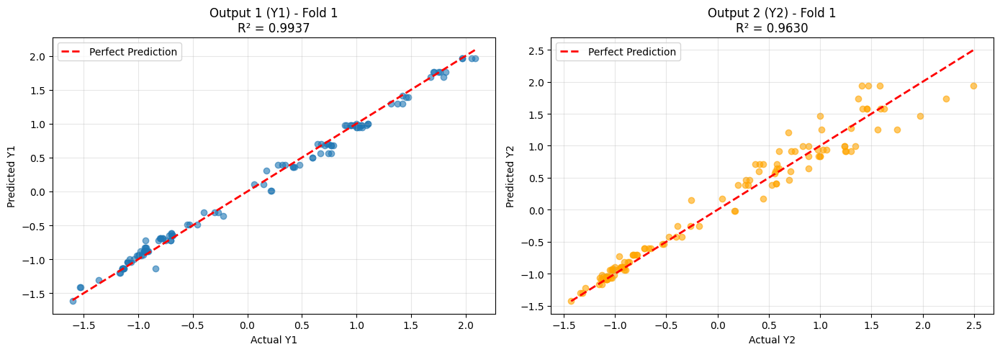

--- Fold 2/5 ---
Fold 2 Evaluation: Loss (MSE) = 0.0172, MAE = 0.0846
--- Visualizing Predictions for Fold 2 ---
R² Score - Output 1 (Y1): 0.9958
R² Score - Output 2 (Y2): 0.9698
R² Score - Average: 0.9828


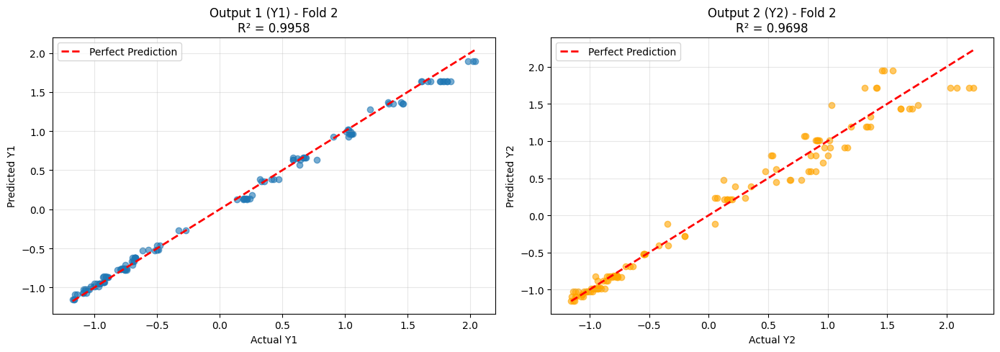

--- Fold 3/5 ---
Fold 3 Evaluation: Loss (MSE) = 0.0219, MAE = 0.1033
--- Visualizing Predictions for Fold 3 ---
R² Score - Output 1 (Y1): 0.9898
R² Score - Output 2 (Y2): 0.9667
R² Score - Average: 0.9782


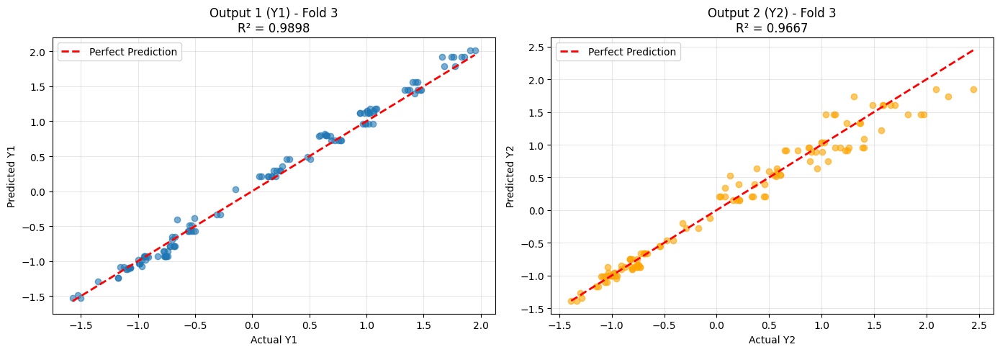

--- Fold 4/5 ---
Fold 4 Evaluation: Loss (MSE) = 0.0179, MAE = 0.0883
--- Visualizing Predictions for Fold 4 ---
R² Score - Output 1 (Y1): 0.9961
R² Score - Output 2 (Y2): 0.9695
R² Score - Average: 0.9828


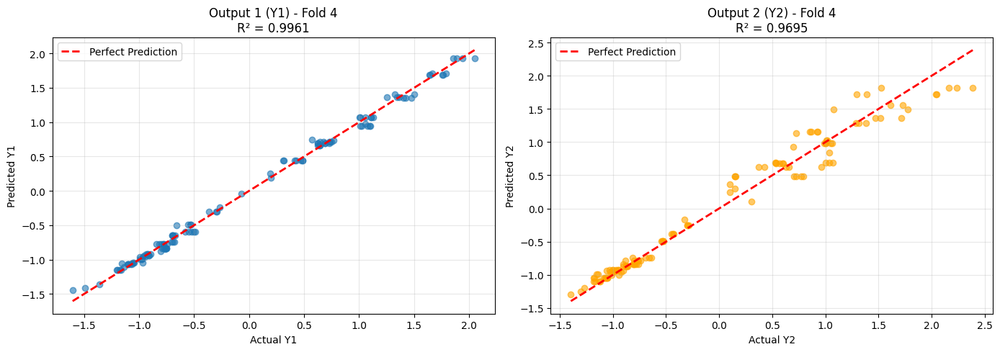

--- Fold 5/5 ---
Fold 5 Evaluation: Loss (MSE) = 0.0145, MAE = 0.0758
--- Visualizing Predictions for Fold 5 ---
R² Score - Output 1 (Y1): 0.9959
R² Score - Output 2 (Y2): 0.9712
R² Score - Average: 0.9835


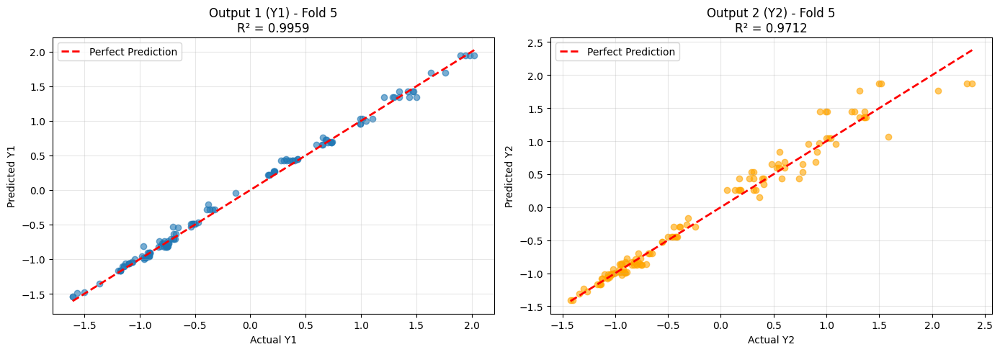

In [98]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import r2_score, mean_absolute_error

# Define training parameters
num_epochs = 100
learning_rate = 0.01

# Lists to store training history for each fold
fold_histories = []
fold_val_losses = []
fold_val_maes = []

# Iterate over the folds
for fold, (train_index, val_index) in enumerate(kf.split(X_train)):
    print(f"--- Fold {fold+1}/{n_splits} ---")

    # Split the training data into training and validation sets for the current fold
    X_train_fold, X_val_fold = X_train_scaled[train_index], X_train_scaled[val_index]
    y_train_fold, y_val_fold = y_train_scaled[train_index], y_train_scaled[val_index]

    # Instantiate a new model for this fold
    model = build_mlp_regression()

    # Compile model with regression loss and metrics
    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='mse',
                  metrics=['mae'])

    # Train model
    history = model.fit(X_train_fold, y_train_fold,
                        validation_data=(X_val_fold, y_val_fold),
                        epochs=num_epochs,
                        verbose=0)

    # Store history and final validation metrics for this fold
    fold_histories.append(history)
    fold_val_losses.append(history.history['val_loss'][-1])
    fold_val_maes.append(history.history['val_mae'][-1])

    # Print evaluation for the current fold on its validation set
    loss, mae = model.evaluate(X_val_fold, y_val_fold, verbose=0)
    print(f"Fold {fold+1} Evaluation: Loss (MSE) = {loss:.4f}, MAE = {mae:.4f}")

    # Multi-output regression visualization
    print(f"--- Visualizing Predictions for Fold {fold+1} ---")
    y_pred = model.predict(X_val_fold, verbose=0)  # Shape: (n_samples, 2)

    # Calculate R² score for each output
    r2_output1 = r2_score(y_val_fold[:, 0], y_pred[:, 0])
    r2_output2 = r2_score(y_val_fold[:, 1], y_pred[:, 1])

    print(f"R² Score - Output 1 (Y1): {r2_output1:.4f}")
    print(f"R² Score - Output 2 (Y2): {r2_output2:.4f}")
    print(f"R² Score - Average: {(r2_output1 + r2_output2) / 2:.4f}")

    # Create side-by-side plots for both outputs
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Plot for Output 1 (Y1)
    axes[0].scatter(y_val_fold[:, 0], y_pred[:, 0], alpha=0.6)
    axes[0].plot([y_val_fold[:, 0].min(), y_val_fold[:, 0].max()],
                 [y_val_fold[:, 0].min(), y_val_fold[:, 0].max()],
                 'r--', lw=2, label='Perfect Prediction')
    axes[0].set_xlabel('Actual Y1')
    axes[0].set_ylabel('Predicted Y1')
    axes[0].set_title(f'Output 1 (Y1) - Fold {fold+1}\nR² = {r2_output1:.4f}')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    # Plot for Output 2 (Y2)
    axes[1].scatter(y_val_fold[:, 1], y_pred[:, 1], alpha=0.6, color='orange')
    axes[1].plot([y_val_fold[:, 1].min(), y_val_fold[:, 1].max()],
                 [y_val_fold[:, 1].min(), y_val_fold[:, 1].max()],
                 'r--', lw=2, label='Perfect Prediction')
    axes[1].set_xlabel('Actual Y2')
    axes[1].set_ylabel('Predicted Y2')
    axes[1].set_title(f'Output 2 (Y2) - Fold {fold+1}\nR² = {r2_output2:.4f}')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

We observe that the final validation losses (MSE), MAE and R2 score of each fold vary:
- All folds hold different results for their metrics, but on average the R2 score is very close to 1 for each fold, meaning that the model is performing very well on the validation sets.
- The MAE value is very low for each fold, meaning that there are few errors in predicting the target on the validation sets.
- The 2 plots for each fold show us the actual vs. predicted values for both targets Y1 and Y2, and we can see that the model is a bit better at predicting Y1 than Y2.


Average performance across all folds.

In [99]:
print(f"Average Validation MSE: {np.mean(fold_val_losses):.4f} (+/- {np.std(fold_val_losses):.4f})")
print(f"Average Validation MAE: {np.mean(fold_val_maes):.4f} (+/- {np.std(fold_val_maes):.4f})")

Average Validation MSE: 0.0188 (+/- 0.0030)
Average Validation MAE: 0.0909 (+/- 0.0106)


- The low values for avergae validation loss (MSE) and MAE show us that the model is performing very well with few lossess.

#### Plot training and validation loss curves

Plot training loss curve.

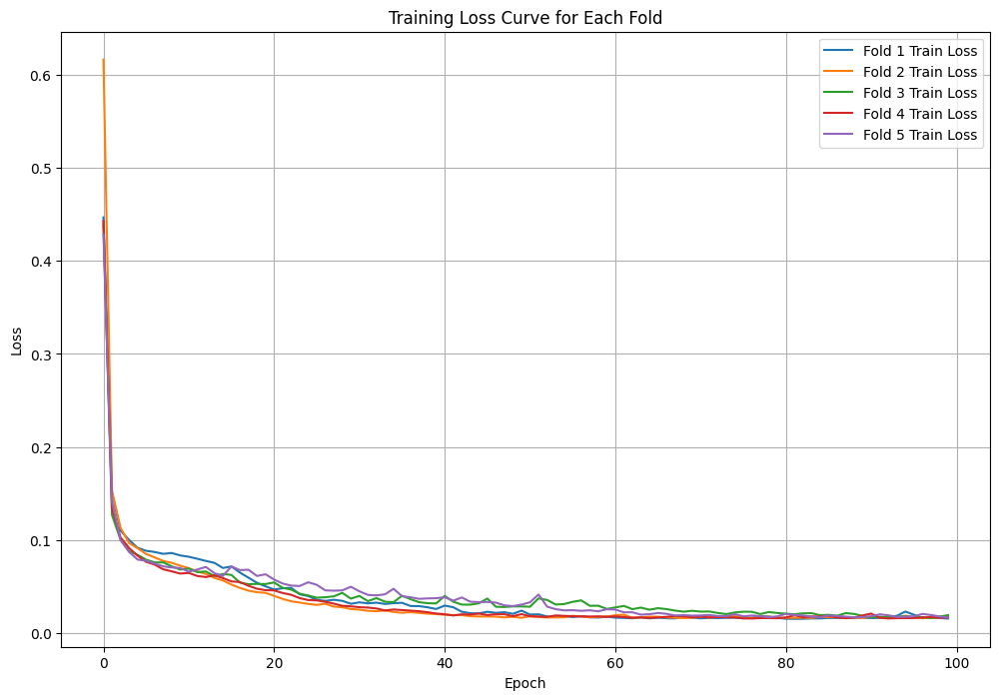

In [100]:
# Plot training loss curve for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories):
    plt.plot(history.history['loss'], label=f'Fold {fold+1} Train Loss')

plt.title('Training Loss Curve for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

Plot validation loss curve.

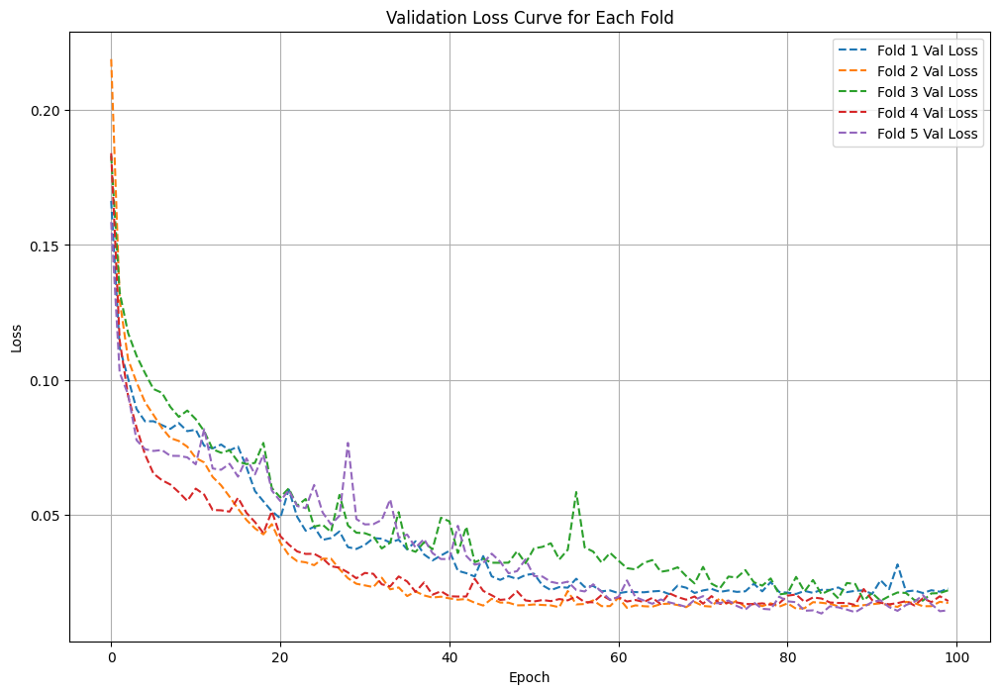

In [101]:
# Plot validation loss curve for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories):
    plt.plot(history.history['val_loss'], label=f'Fold {fold+1} Val Loss', linestyle='--')

plt.title('Validation Loss Curve for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

We observe from the training and validation loss curves plots that:
- Across all Folds 1 to 5 the curves dicrease, meaning that the model is performing well.

#### Plot training and validation MAE

Plot train MAE curves.

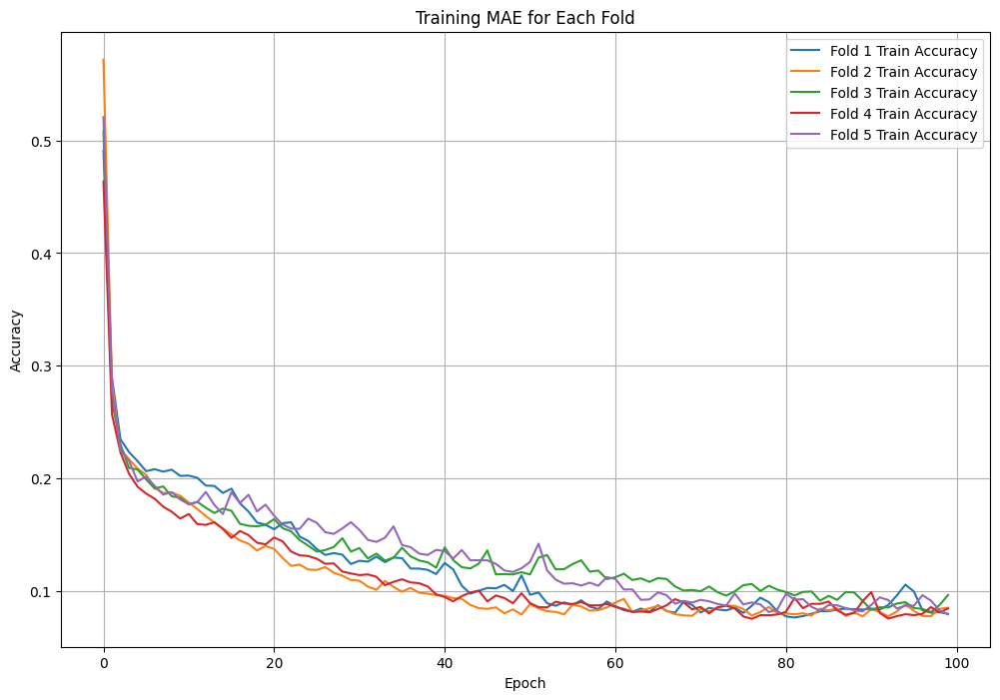

In [102]:
# Plot training accuracy curves for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories):
    plt.plot(history.history['mae'], label=f'Fold {fold+1} Train Accuracy')

plt.title('Training MAE for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

Plot validation MAE curves.

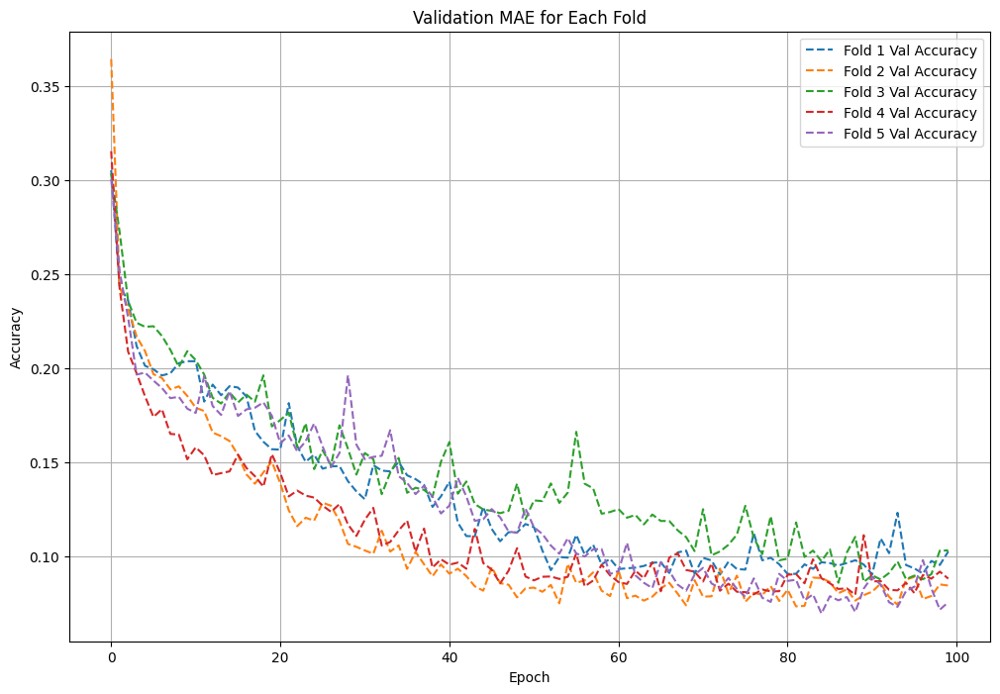

In [103]:
# Plot validation accuracy curves for each fold
plt.figure(figsize=(12, 8))
for fold, history in enumerate(fold_histories):
    plt.plot(history.history['val_mae'], label=f'Fold {fold+1} Val Accuracy', linestyle='--')

plt.title('Validation MAE for Each Fold')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

#### Visualise predictions of the model

Instantiate the final model.

In [127]:
final_model = build_mlp_regression()

Compile the model using `Adam`.

In [129]:
final_model.compile(optimizer=Adam(learning_rate=0.01),
                    loss='mse',
                    metrics=['mae'])

Train the model on full training data.

In [130]:
history = final_model.fit(X_train_scaled, y_train_scaled,
                    epochs=num_epochs,
                    validation_split=0.2,
                    verbose=1)

Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.4775 - mae: 0.5152 - val_loss: 0.1503 - val_mae: 0.2915
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.1186 - mae: 0.2600 - val_loss: 0.1096 - val_mae: 0.2290
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0978 - mae: 0.2163 - val_loss: 0.0928 - val_mae: 0.2097
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0883 - mae: 0.2018 - val_loss: 0.0881 - val_mae: 0.2035
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0759 - mae: 0.1931 - val_loss: 0.0948 - val_mae: 0.2158
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0759 - mae: 0.1904 - val_loss: 0.0844 - val_mae: 0.2028
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0885 - mae: 0.2106 - val_loss: 0.0753 - val_mae: 0.1860
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0640 - mae: 0.1727 - val_loss: 0.0718 - val_mae: 0.1851
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - lo

Evaluate the model.

In [131]:
test_loss, test_mae = final_model.evaluate(X_test_scaled, y_test_scaled, verbose=0)

print(f"Final Model Test Loss MSE: {test_loss:.4f}")
print(f"Final Model Test MAE: {test_mae:.4f}")

Final Model Test Loss MSE: 0.0242
Final Model Test MAE: 0.1133


Visualize the regression metrics.

In [132]:
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

# Predict on test data
y_pred_test = final_model.predict(X_test_scaled)

# Calculate metrics for each output
r2_output1 = r2_score(y_test_scaled[:, 0], y_pred_test[:, 0])
r2_output2 = r2_score(y_test_scaled[:, 1], y_pred_test[:, 1])
mae_output1 = mean_absolute_error(y_test_scaled[:, 0], y_pred_test[:, 0])
mae_output2 = mean_absolute_error(y_test_scaled[:, 1], y_pred_test[:, 1])
mse_output1 = mean_squared_error(y_test_scaled[:, 0], y_pred_test[:, 0])
mse_output2 = mean_squared_error(y_test_scaled[:, 1], y_pred_test[:, 1])

# Print detailed metrics
print(f"Output 1 (Y1) - R²: {r2_output1:.4f}, MAE: {mae_output1:.4f}, MSE: {mse_output1:.4f}")
print(f"Output 2 (Y2) - R²: {r2_output2:.4f}, MAE: {mae_output2:.4f}, MSE: {mse_output2:.4f}")
print(f"Average R²: {(r2_output1 + r2_output2) / 2:.4f}")


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Output 1 (Y1) - R²: 0.9905, MAE: 0.0811, MSE: 0.0098
Output 2 (Y2) - R²: 0.9626, MAE: 0.1455, MSE: 0.0386
Average R²: 0.9766


Plot training and validation loss.

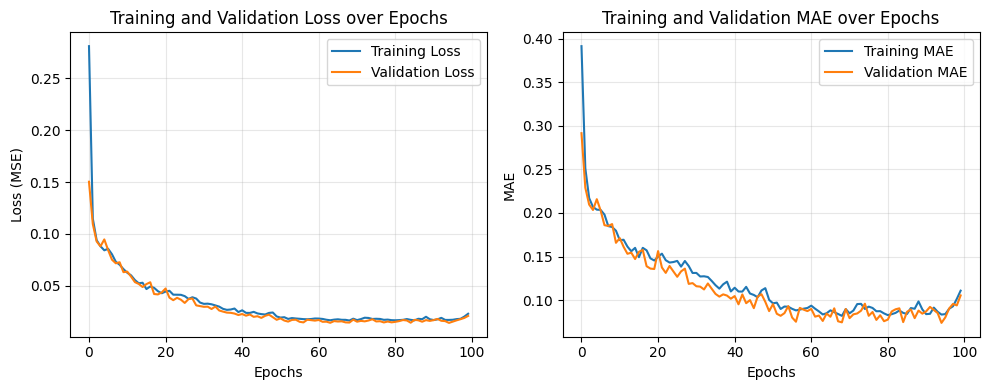

In [134]:
# Plot training and validation loss
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.title('Training and Validation Loss over Epochs')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.plot(history.history['mae'], label='Training MAE')
plt.plot(history.history['val_mae'], label='Validation MAE')
plt.xlabel('Epochs')
plt.ylabel('MAE')
plt.title('Training and Validation MAE over Epochs')
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Create visualization: Predicted vs Actual for both outputs

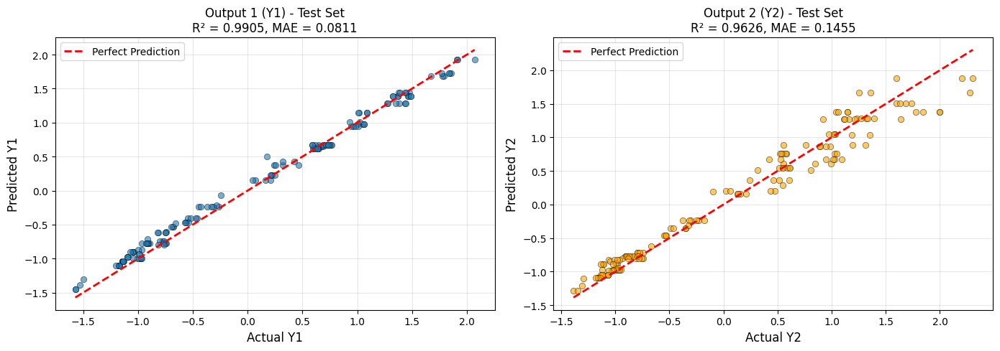

In [133]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Plot for Output 1 (Y1)
axes[0].scatter(y_test_scaled[:, 0], y_pred_test[:, 0], alpha=0.6, edgecolors='k', linewidth=0.5)
axes[0].plot([y_test_scaled[:, 0].min(), y_test_scaled[:, 0].max()],
             [y_test_scaled[:, 0].min(), y_test_scaled[:, 0].max()],
             'r--', lw=2, label='Perfect Prediction')
axes[0].set_xlabel('Actual Y1', fontsize=12)
axes[0].set_ylabel('Predicted Y1', fontsize=12)
axes[0].set_title(f'Output 1 (Y1) - Test Set\nR² = {r2_output1:.4f}, MAE = {mae_output1:.4f}', fontsize=12)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot for Output 2 (Y2)
axes[1].scatter(y_test_scaled[:, 1], y_pred_test[:, 1], alpha=0.6, color='orange', edgecolors='k', linewidth=0.5)
axes[1].plot([y_test_scaled[:, 1].min(), y_test_scaled[:, 1].max()],
             [y_test_scaled[:, 1].min(), y_test_scaled[:, 1].max()],
             'r--', lw=2, label='Perfect Prediction')
axes[1].set_xlabel('Actual Y2', fontsize=12)
axes[1].set_ylabel('Predicted Y2', fontsize=12)
axes[1].set_title(f'Output 2 (Y2) - Test Set\nR² = {r2_output2:.4f}, MAE = {mae_output2:.4f}', fontsize=12)
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


### **Conclusion**
- The final model trained on the full training dataset with the Adam optimizer and the simple architecture appears to perform very well on the unseen test set.
- The high R2 score and the low values of MAE for Y1 and Y2 show that the model is predicting very well the 2 targets.
- We can see from both the metrics and the plot that Y1 is better predicted than Y2.
